In [42]:
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import os
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import TimeSeriesSplit
import ta  # Technical Analysis library

# Load environment variables
_ = load_dotenv()

import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Configuration to suppress warnings
warnings.filterwarnings('ignore')

# Additional configurations for better control over visualizations (optional)
plt.style.use('ggplot')  # For ggplot-like style in plots
pd.options.display.max_columns = None  # Ensure all columns are visible when displaying DataFrames


## Loading the Dataset

In [43]:
# Define the path to the dataset
file_path = '/Users/aryasmc/My_USD/Year_2024/Summer_2024/Capstone_Project/Capstone_Project/Cleaned_Data/cleaned_crypto_updated_722.csv'

# Load the dataset
df = pd.read_csv(file_path)

In [3]:
df.head()

,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
0,2021-07-16,ADA-USD,1.16610,1.2452,1.22490,1.17140,3.676491e+07,-0.05350,1.205650,6.783295,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.17140,1.17140,1.17140,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-16,COMP-USD,367.10000,410.5000,398.45000,367.89000,2.381554e+04,-30.56000,388.800000,11.822392,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,367.89000,367.89000,367.89000,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-07-16,ETH-USD,1850.15000,1965.3500,1918.99000,1877.22000,1.842217e+05,-41.77000,1907.750000,6.226522,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1877.22000,1877.22000,1877.22000,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-07-16,LINK-USD,15.13583,16.3345,15.77288,15.23963,2.246281e+06,-0.53325,15.735165,7.919420,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.23963,15.23963,15.23963,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-07-16,LTC-USD,120.44000,127.8200,125.92000,120.68000,1.305546e+05,-5.24000,124.130000,6.127532,NaN,4,Friday,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120.68000,120.68000,120.68000,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
df.shape

(10764, 32)

In [45]:
# 'day_of_week' is incorrectly represented as starting from Tuesday (1)
# Correcting to start from Monday (0)
df['day_of_week'] = (df['day_of_week'] - 1) % 7

# Mapping corrected day names
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df['day_name'] = df['day_of_week'].map(day_names)


## Additional Feature Engineering

In [46]:
# Adding more moving averages and Bollinger Bands
df['SMA_10'] = df.groupby('product_id')['close'].transform(lambda x: x.rolling(window=10).mean())
df['SMA_30'] = df.groupby('product_id')['close'].transform(lambda x: x.rolling(window=30).mean())
df['Bollinger_High'] = df.groupby('product_id')['close'].transform(lambda x: ta.volatility.BollingerBands(x, window=20, window_dev=2).bollinger_hband())
df['Bollinger_Low'] = df.groupby('product_id')['close'].transform(lambda x: ta.volatility.BollingerBands(x, window=20, window_dev=2).bollinger_lband())

# Adding On-Balance Volume (OBV)
df['OBV'] = df.groupby('product_id').apply(lambda x: ta.volume.OnBalanceVolumeIndicator(close=x['close'], volume=x['volume']).on_balance_volume()).reset_index(level=0, drop=True)

# Adding Average True Range (ATR)
df['ATR'] = df.groupby('product_id').apply(lambda x: ta.volatility.AverageTrueRange(high=x['high'], low=x['low'], close=x['close']).average_true_range()).reset_index(level=0, drop=True)

# Adding Stochastic Oscillator
df['Stochastic_Oscillator'] = df.groupby('product_id').apply(lambda x: ta.momentum.StochasticOscillator(high=x['high'], low=x['low'], close=x['close']).stoch()).reset_index(level=0, drop=True)

# Adding another RSI with a different period
df['RSI_14'] = df.groupby('product_id')['close'].transform(lambda x: ta.momentum.RSIIndicator(x, window=14).rsi())

# Verify addition
print("Features added successfully!")

Features added successfully!


- Simple Moving Averages (SMA): Capture trends and smoothing out short-term fluctuations.
- Bollinger Bands: Provide a measure of volatility and potential overbought or oversold conditions.
- On-Balance Volume (OBV): Measures buying and selling pressure based on volume.
- Average True Range (ATR): A measure of volatility.
- Stochastic Oscillator: Indicates momentum and potential reversal points.
- Relative Strength Index (RSI): Measures the speed and change of price movements.


In [47]:
# Display data types of columns
print(df.dtypes)


time                      object
product_id                object
low                      float64
high                     float64
open                     float64
close                    float64
volume                   float64
price_change             float64
average_price            float64
volatility               float64
pct_change               float64
day_of_week                int64
day_name                  object
close_lag_1              float64
volume_lag_1             float64
close_lag_3              float64
volume_lag_3             float64
close_lag_7              float64
volume_lag_7             float64
close_MA10               float64
close_ema_7              float64
close_ema_14             float64
close_ema_30             float64
RSI                      float64
MACD                     float64
Signal_Line              float64
volatility_7d            float64
volatility_14d           float64
volatility_30d           float64
momentum_1d              float64
momentum_7

In [49]:
# Convert 'time' column to datetime
df['time'] = pd.to_datetime(df['time'])

# Check numeric columns for appropriate types
numeric_columns = ['low', 'high', 'open', 'close', 'volume', 'price_change', 'average_price', 
                   'volatility', 'pct_change', 'close_lag_1', 'volume_lag_1', 'close_lag_3', 
                   'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10', 'close_ema_7', 
                   'close_ema_14', 'close_ema_30', 'RSI', 'MACD', 'Signal_Line', 
                   'volatility_7d', 'volatility_14d', 'volatility_30d', 'momentum_1d', 
                   'momentum_7d', 'momentum_30d', 'SMA_10','SMA_30','Bollinger_High','Bollinger_Low', 'OBV', 'ATR','Stochastic_Oscillator','RSI_14']

# Convert numeric columns to float if necessary
df[numeric_columns] = df[numeric_columns].astype(float)

# Ensure 'product_id' remains as object type
# If 'product_id' needs further adjustments, specify here

# Display updated dtypes to confirm changes
print(df.dtypes)


time                     datetime64[ns]
product_id                       object
low                             float64
high                            float64
open                            float64
close                           float64
volume                          float64
price_change                    float64
average_price                   float64
volatility                      float64
pct_change                      float64
day_of_week                       int64
day_name                         object
close_lag_1                     float64
volume_lag_1                    float64
close_lag_3                     float64
volume_lag_3                    float64
close_lag_7                     float64
volume_lag_7                    float64
close_MA10                      float64
close_ema_7                     float64
close_ema_14                    float64
close_ema_30                    float64
RSI                             float64
MACD                            float64


In [50]:
# Drop 'Unnamed: 0' column if it's not needed
#df.drop(columns=['Unnamed: 0'], inplace=True)

# Confirm the column has been dropped
print(df.columns)


Index(['time', 'product_id', 'low', 'high', 'open', 'close', 'volume',
       'price_change', 'average_price', 'volatility', 'pct_change',
       'day_of_week', 'day_name', 'close_lag_1', 'volume_lag_1', 'close_lag_3',
       'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10',
       'close_ema_7', 'close_ema_14', 'close_ema_30', 'RSI', 'MACD',
       'Signal_Line', 'volatility_7d', 'volatility_14d', 'volatility_30d',
       'momentum_1d', 'momentum_7d', 'momentum_30d', 'SMA_10', 'SMA_30',
       'Bollinger_High', 'Bollinger_Low', 'OBV', 'ATR',
       'Stochastic_Oscillator', 'RSI_14'],
      dtype='object')


In [51]:
# Calculate null counts and percentages for each column
null_counts = df.isnull().sum()
null_percentages = (null_counts / len(df)) * 100

# Combine counts and percentages into a single DataFrame
null_summary = pd.DataFrame({
    'Counts': null_counts,
    'Percentages': null_percentages
})

# Sort by percentage of null values in descending order
null_summary_sorted = null_summary.sort_values(by='Percentages', ascending=False)

# Print columns with null values sorted by highest percentage
print("Columns with null values sorted by highest percentage:")
print(null_summary_sorted)

Columns with null values sorted by highest percentage:
                       Counts  Percentages
volatility_30d            300     2.787068
momentum_30d              300     2.787068
SMA_30                    290     2.694166
Bollinger_Low             190     1.765143
Bollinger_High            190     1.765143
volatility_14d            140     1.300632
RSI_14                    130     1.207729
RSI                       130     1.207729
Stochastic_Oscillator     130     1.207729
SMA_10                     90     0.836120
close_MA10                 90     0.836120
momentum_7d                70     0.650316
close_lag_7                70     0.650316
volume_lag_7               70     0.650316
volatility_7d              70     0.650316
close_lag_3                30     0.278707
volume_lag_3               30     0.278707
pct_change                 10     0.092902
close_lag_1                10     0.092902
volume_lag_1               10     0.092902
momentum_1d                10     0.092902

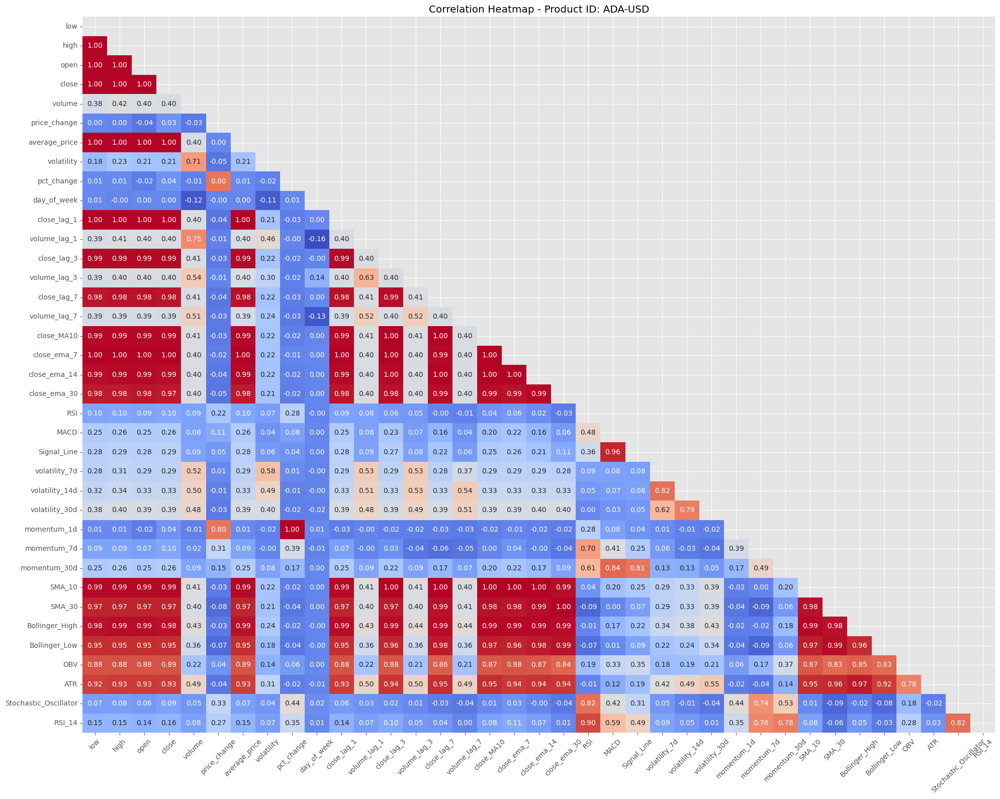

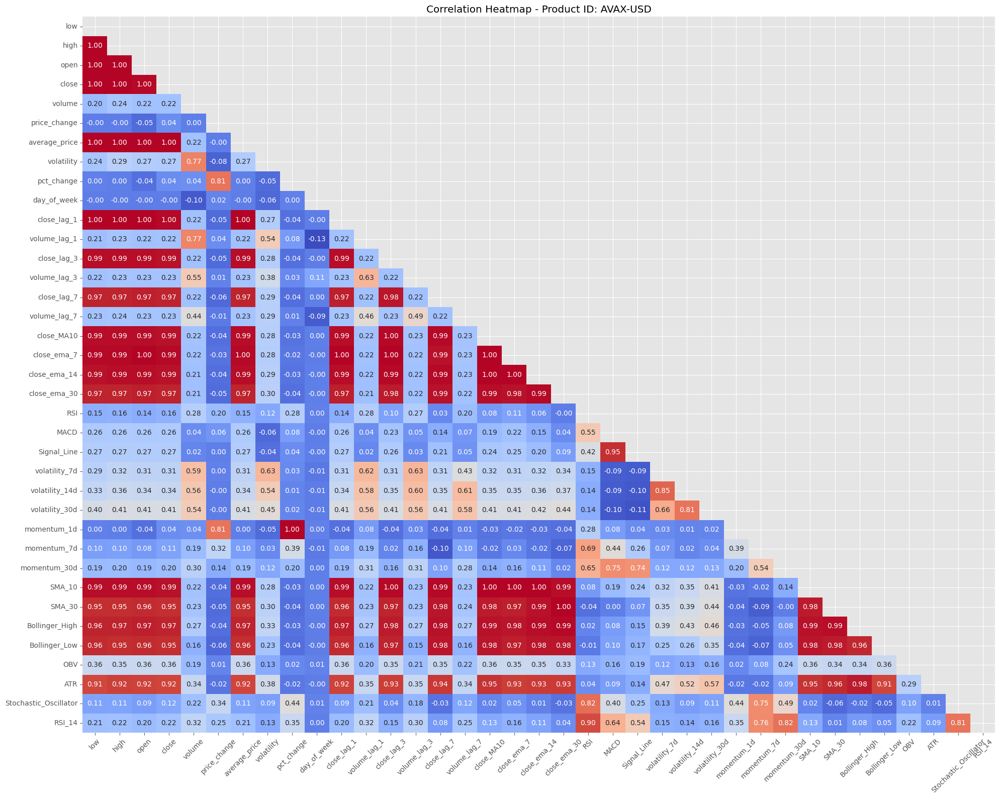

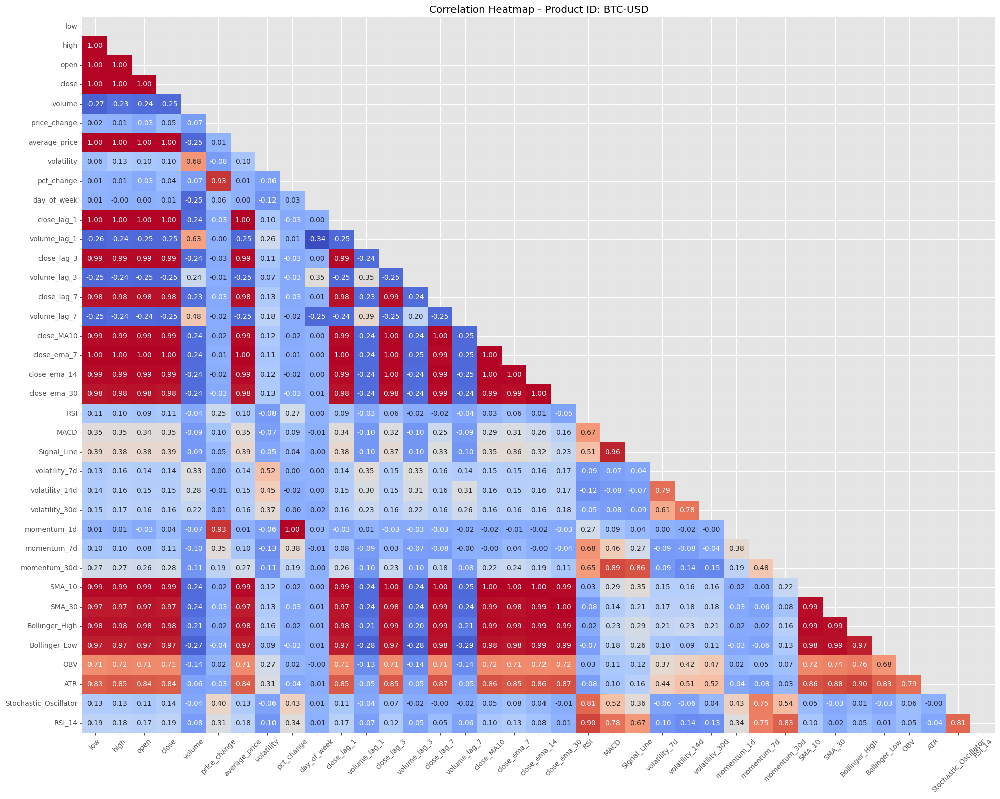

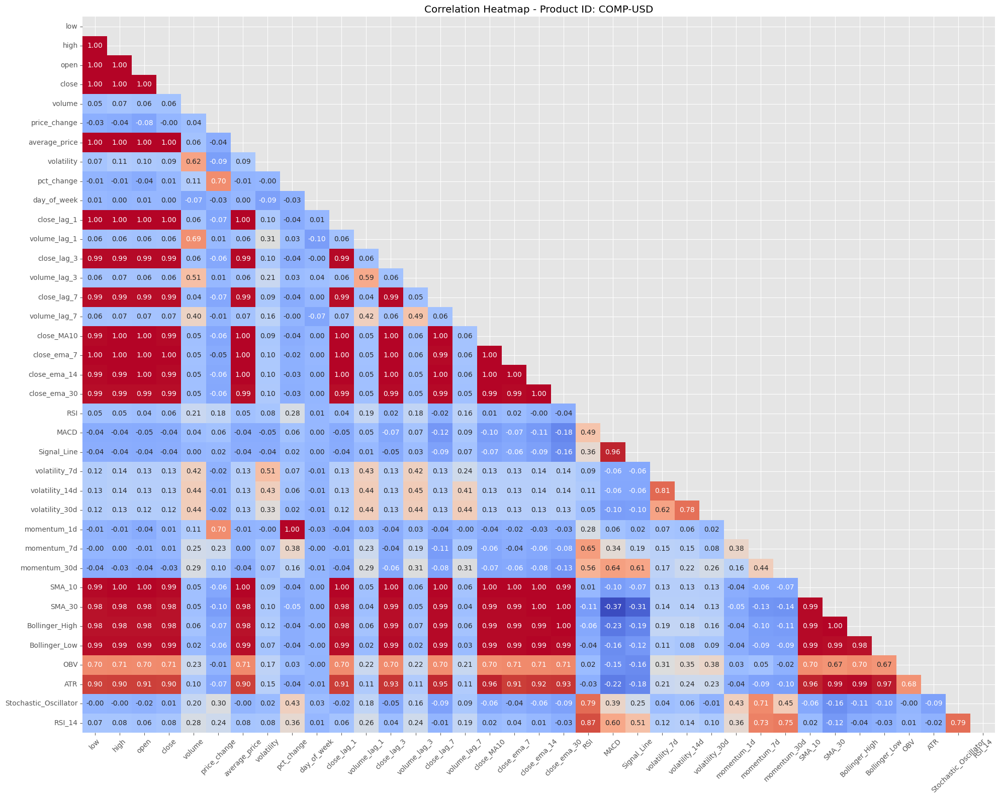

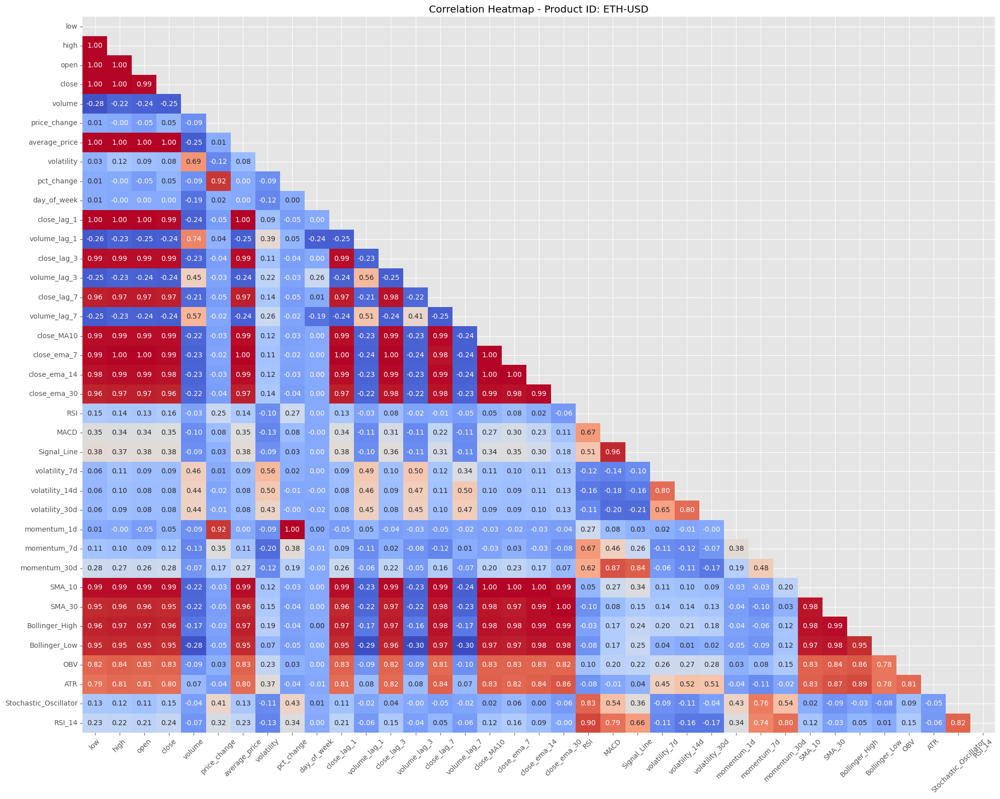

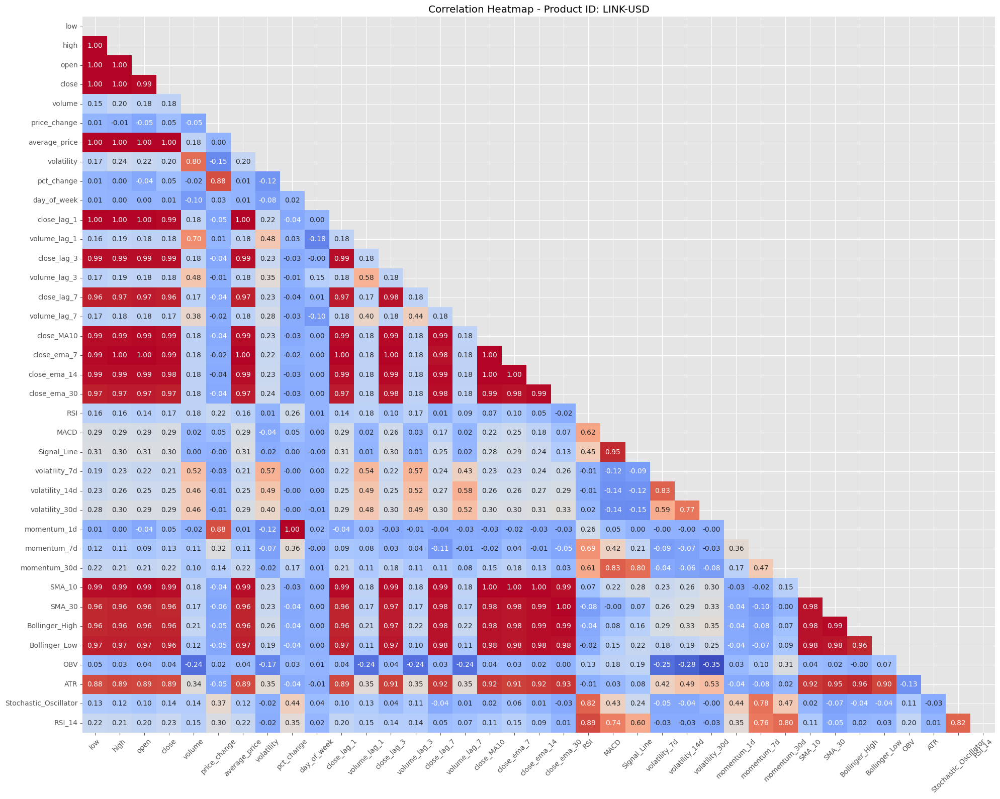

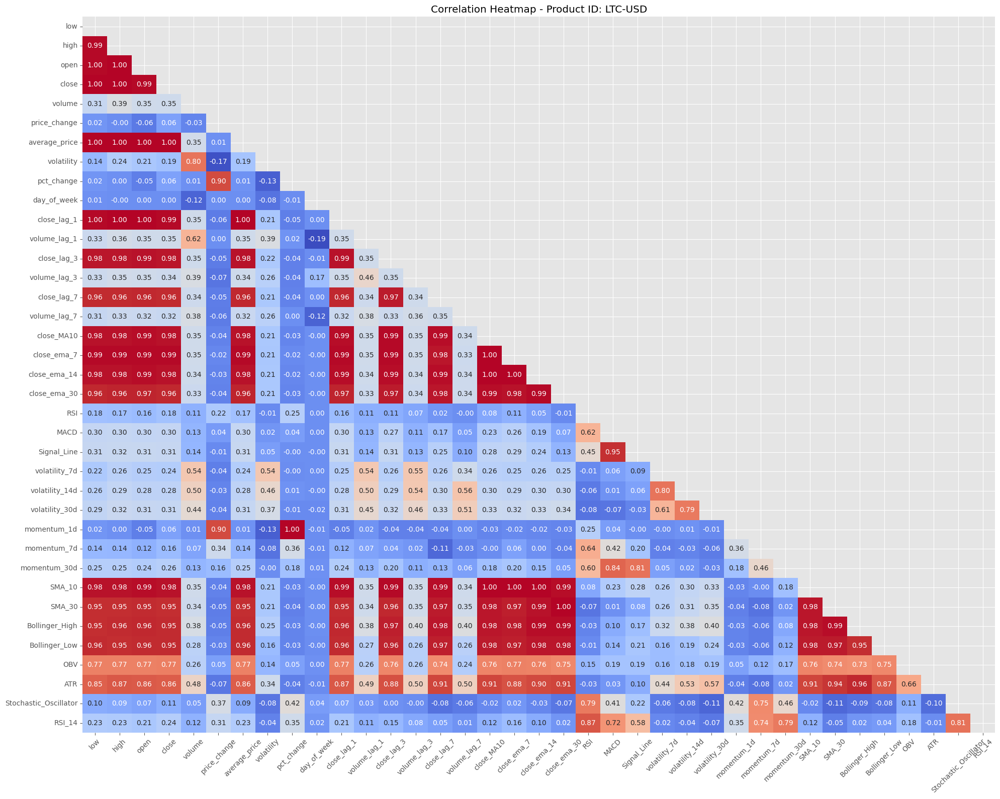

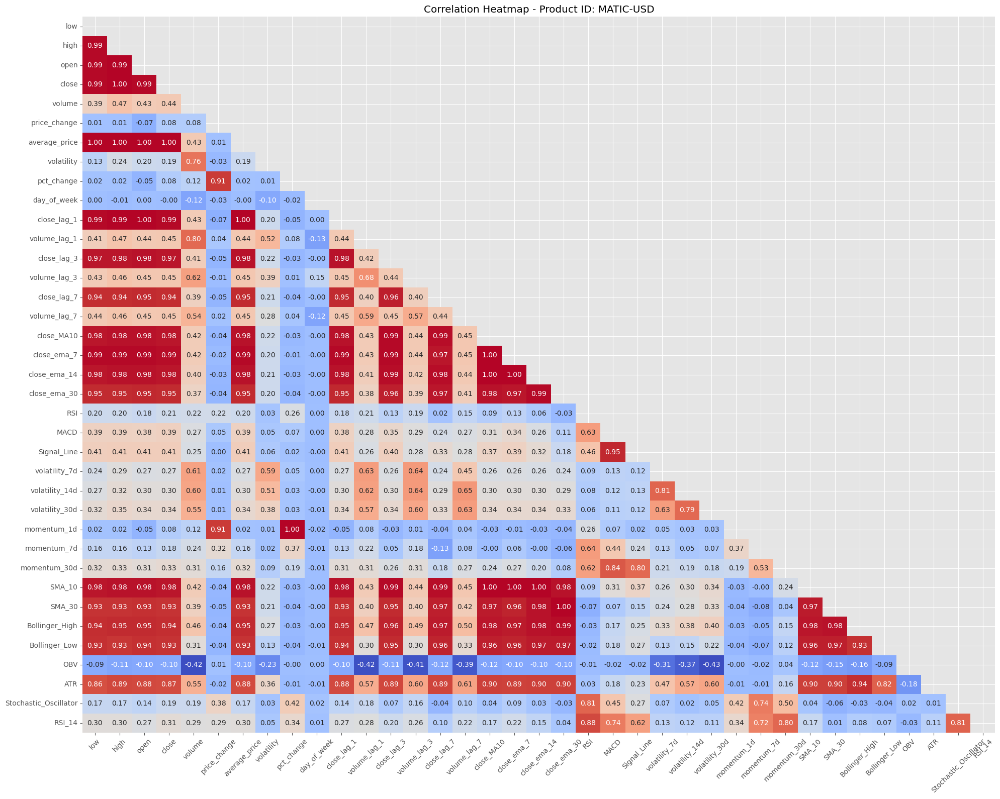

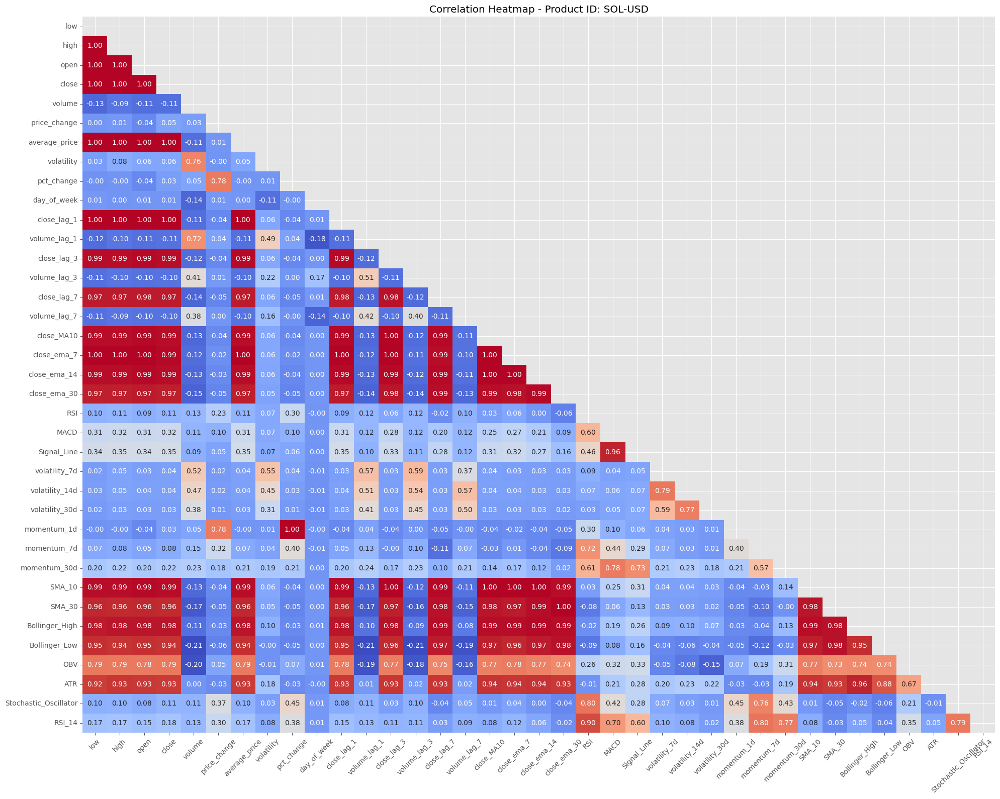

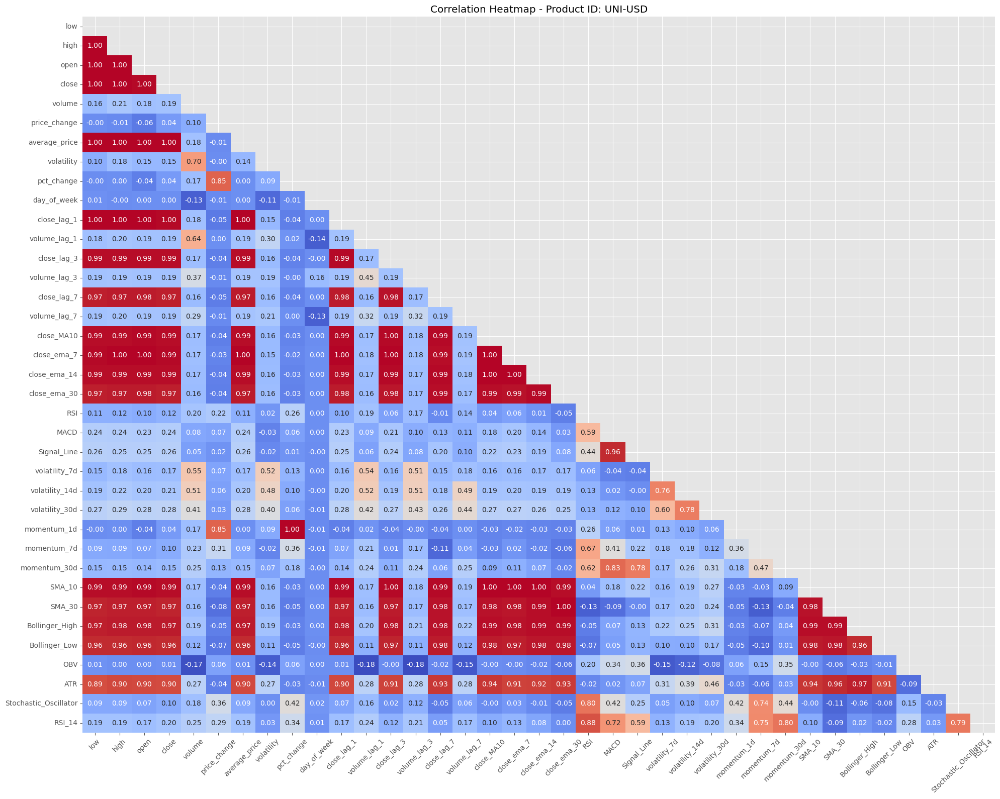

In [54]:
# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group (up to 10 groups)
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break
    
    # Select numeric columns based on dtype
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
    # Compute correlations for the group
    corr = group[numeric_columns].corr()
    
    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    # Initialize a figure with larger size
    plt.figure(figsize=(20, 16))
    
    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    
    # Show plot
    plt.tight_layout()
    plt.show()


In [11]:
# Print all unique product IDs
unique_product_ids = df['product_id'].unique()
print("Unique Product IDs:")
for product_id in unique_product_ids:
    print(product_id)


Unique Product IDs:
ADA-USD
COMP-USD
ETH-USD
LINK-USD
LTC-USD
MATIC-USD
SOL-USD
UNI-USD
BTC-USD
AVAX-USD


In [55]:
# Columns to drop
columns_to_drop = [
    'average_price', 'close_lag_1', 'close_lag_3', 'close_lag_7',
    'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30','SMA_10','SMA_30','Bollinger_High','Bollinger_Low', 'OBV', 'ATR','Stochastic_Oscillator'
]

# Drop the specified columns
df.drop(columns=columns_to_drop, inplace=True)


In [56]:
df.head(2)

,time,product_id,low,high,open,close,volume,price_change,volatility,pct_change,day_of_week,day_name,volume_lag_1,volume_lag_3,volume_lag_7,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d,RSI_14
0,2021-07-16,ADA-USD,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,6.783295,NaN,3,Thursday,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-16,COMP-USD,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,11.822392,NaN,3,Thursday,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


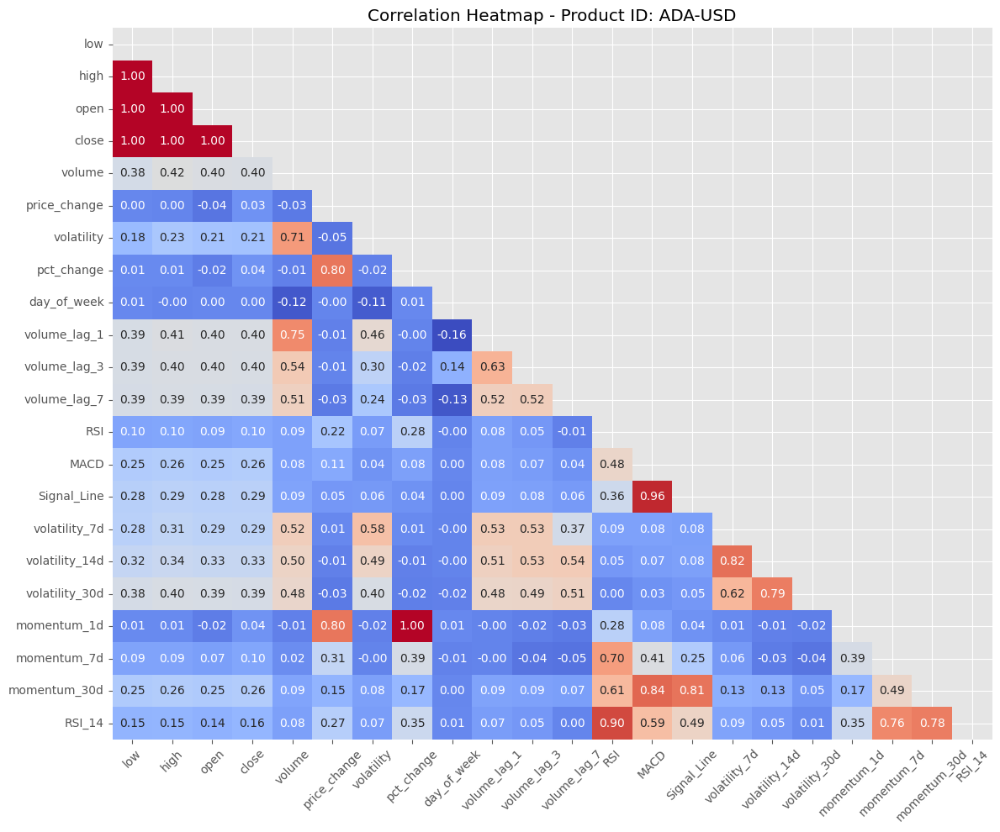

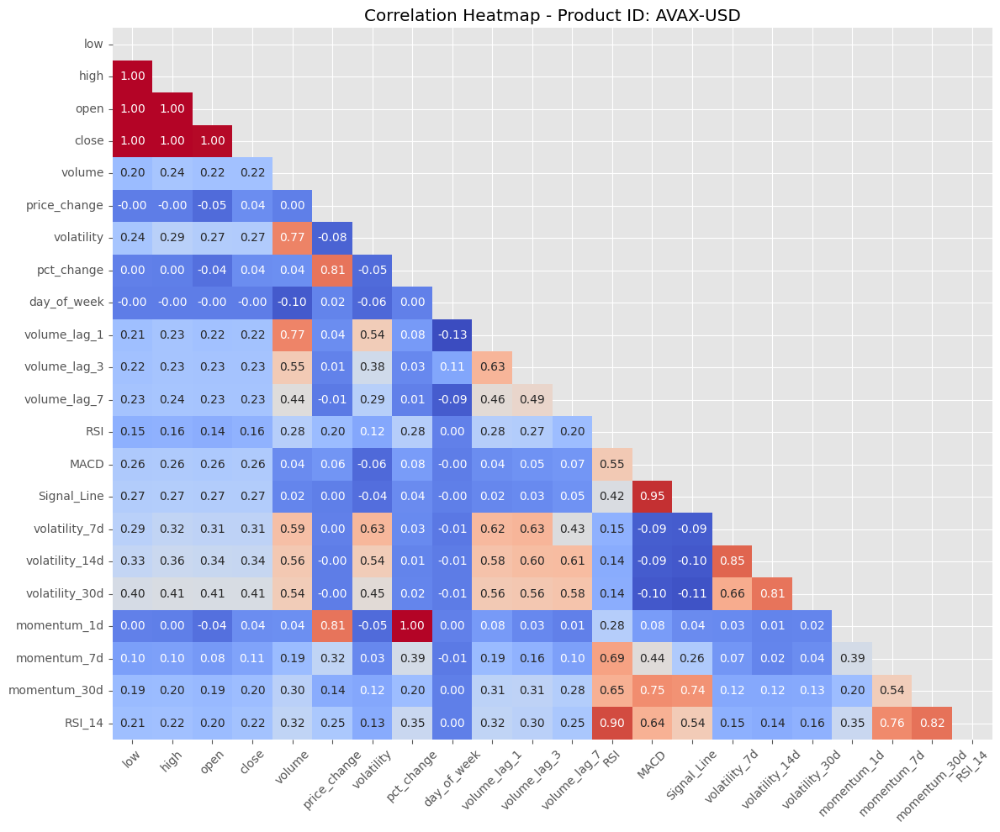

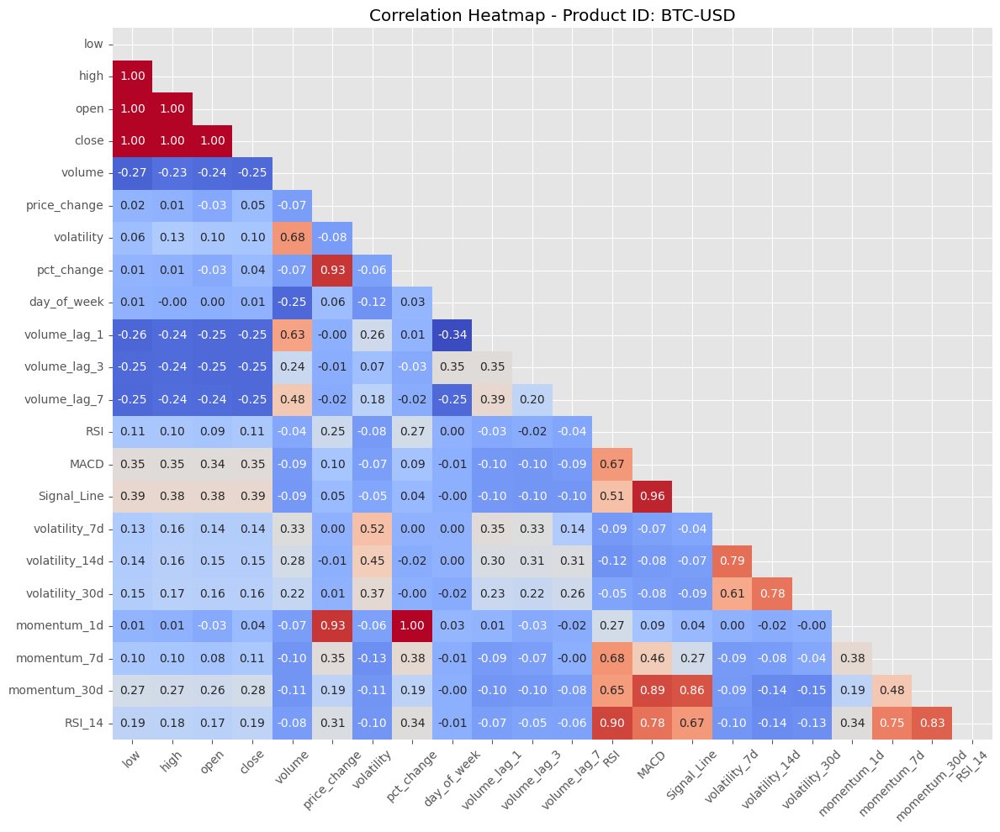

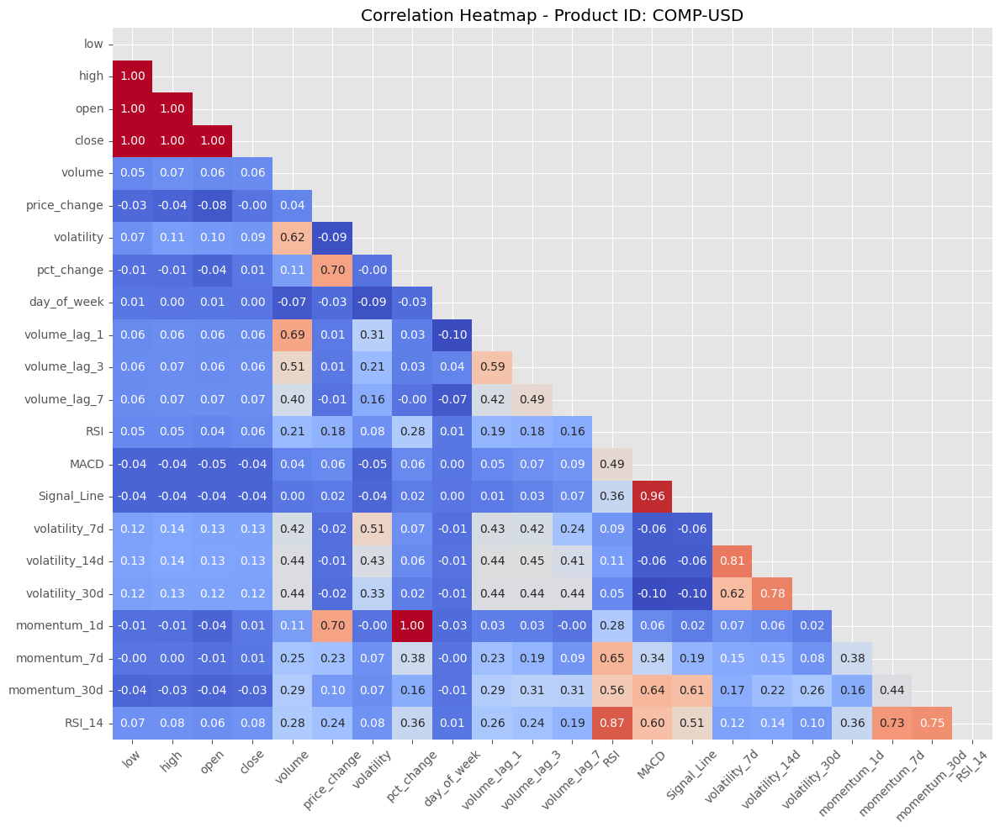

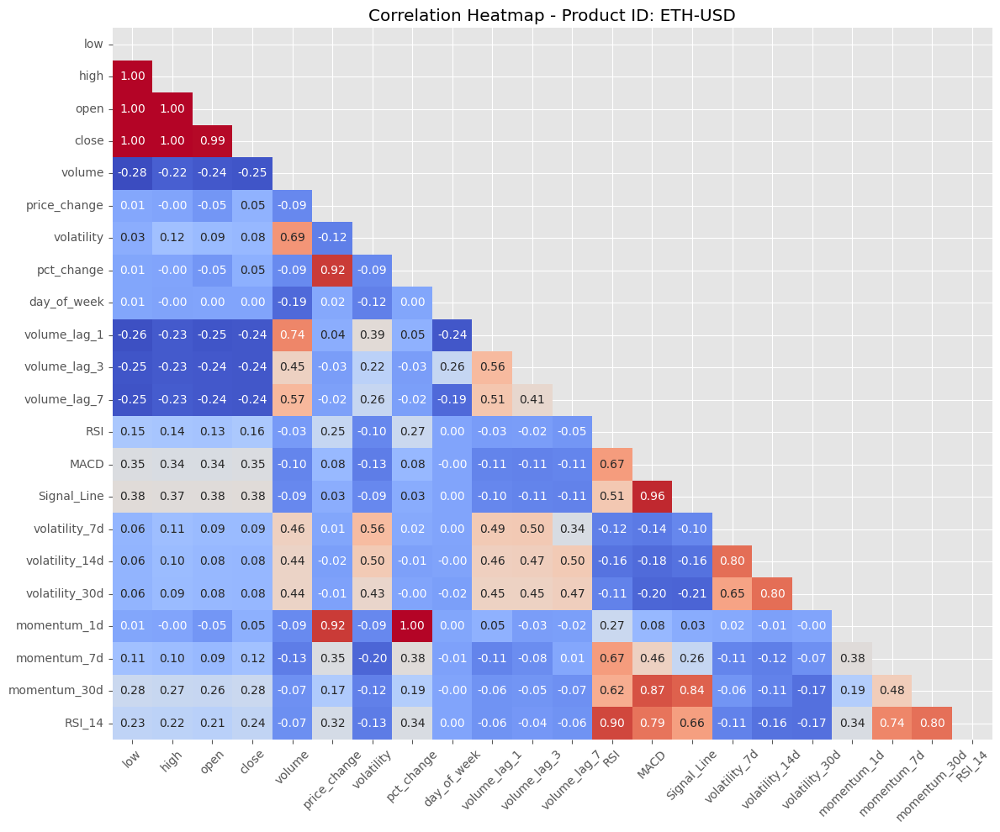

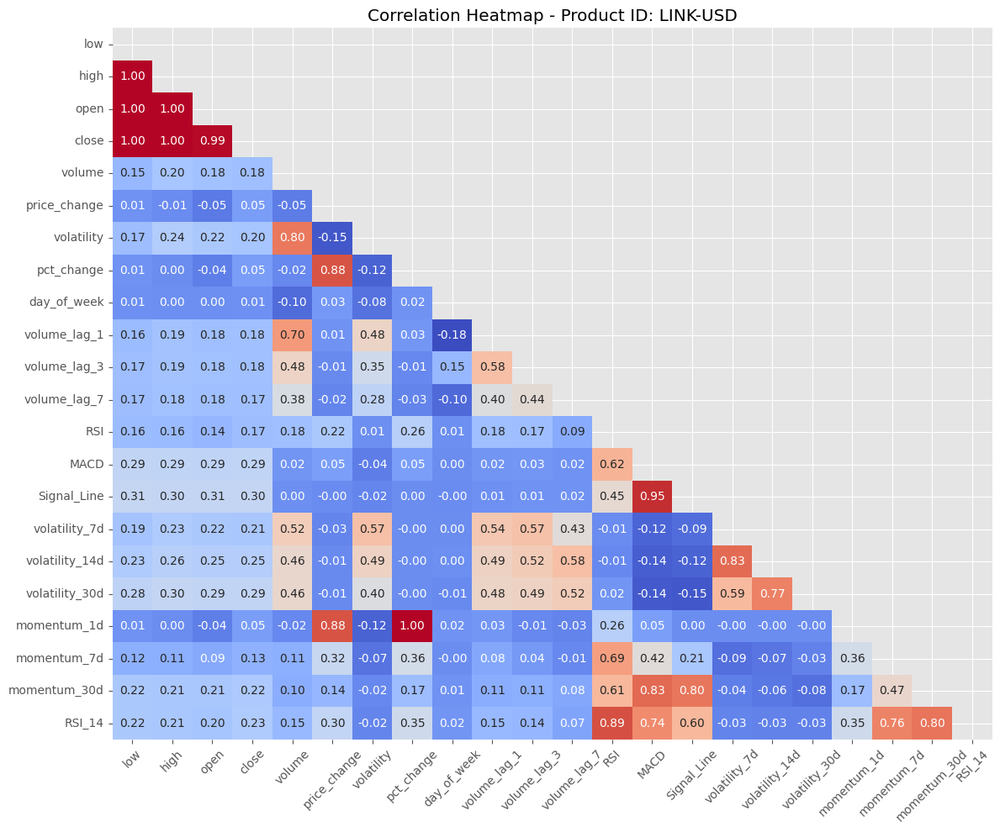

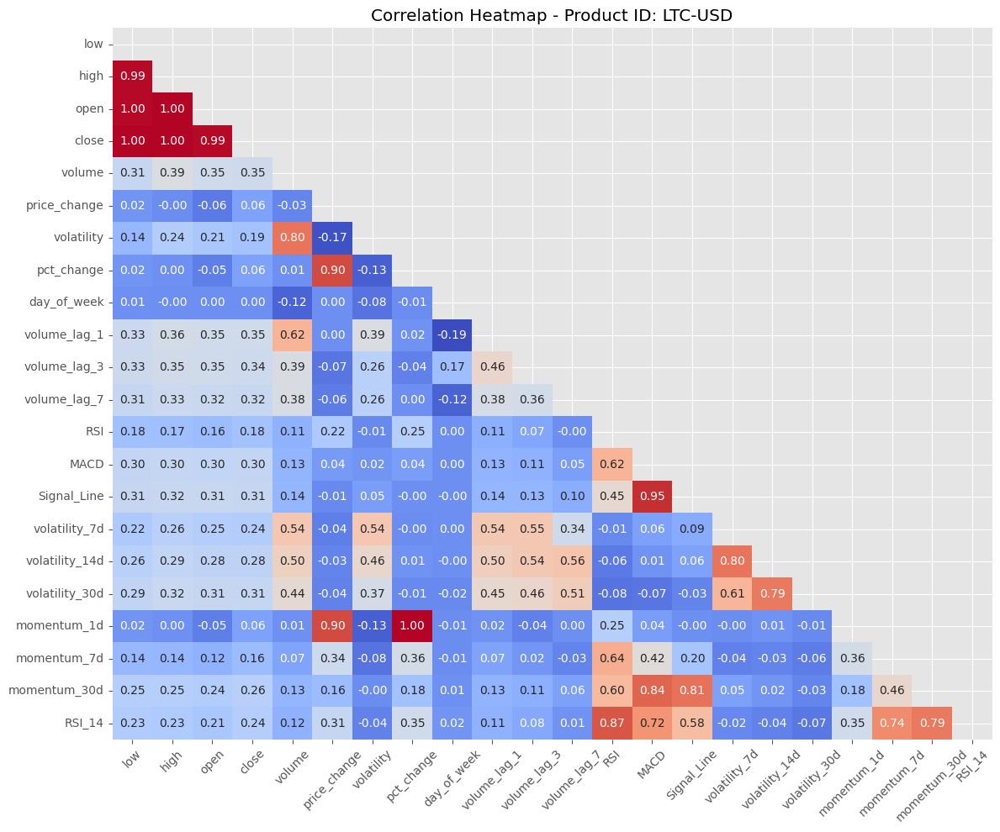

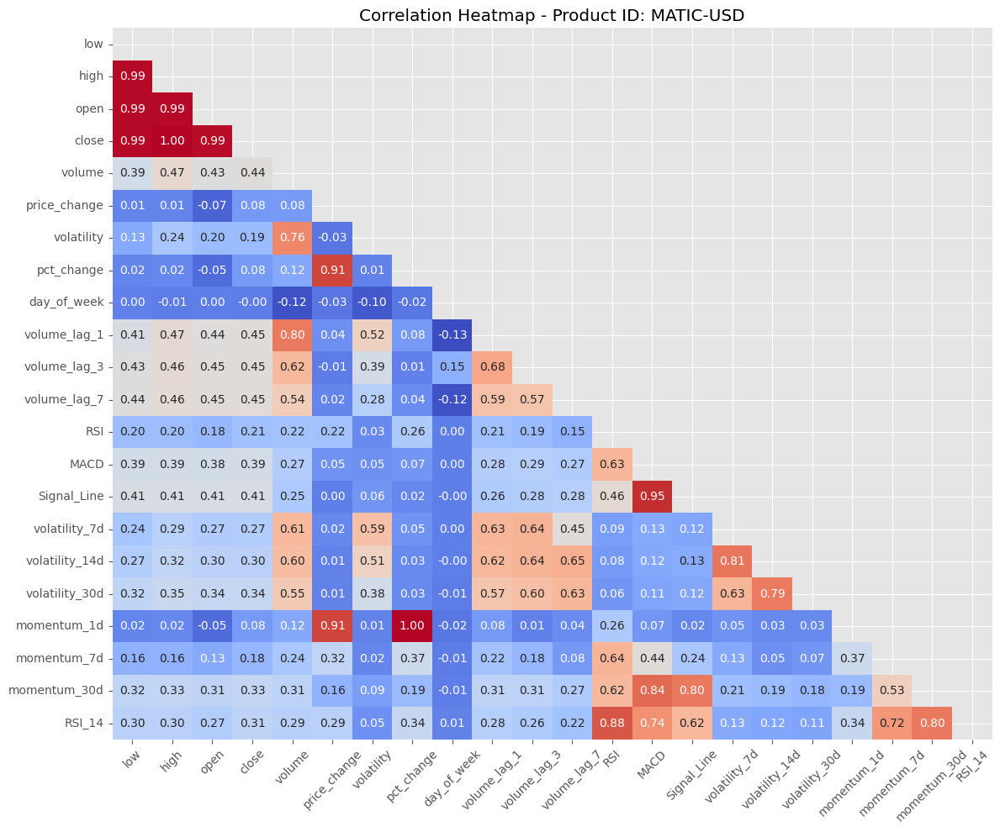

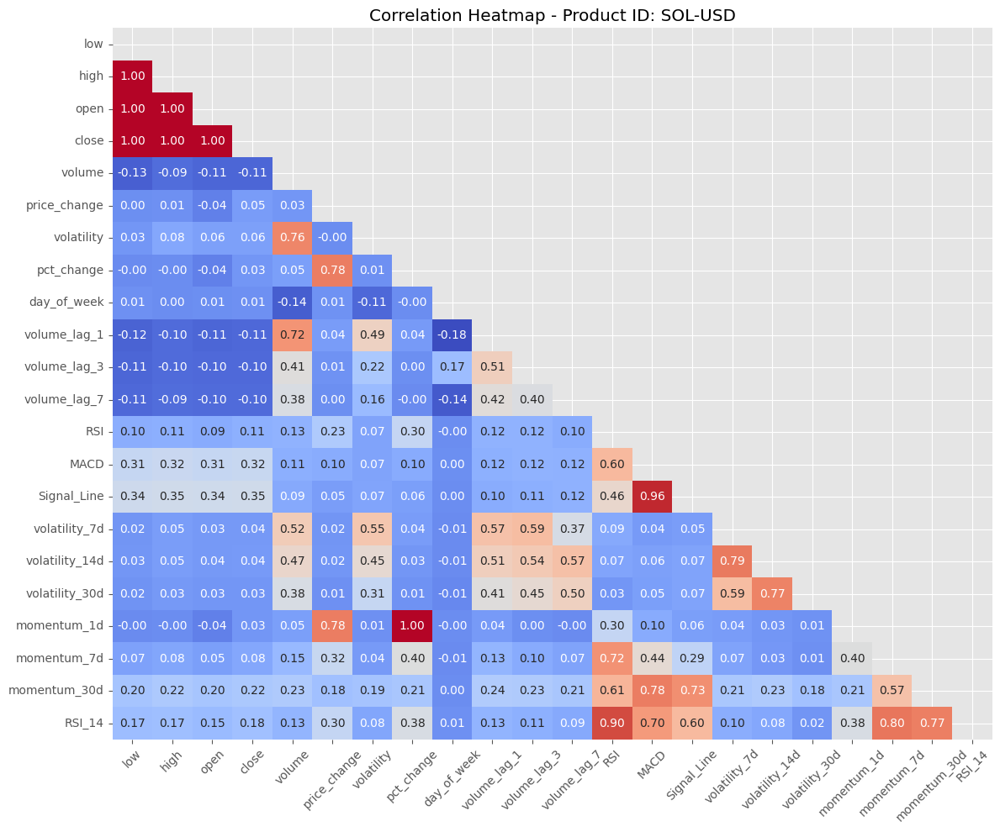

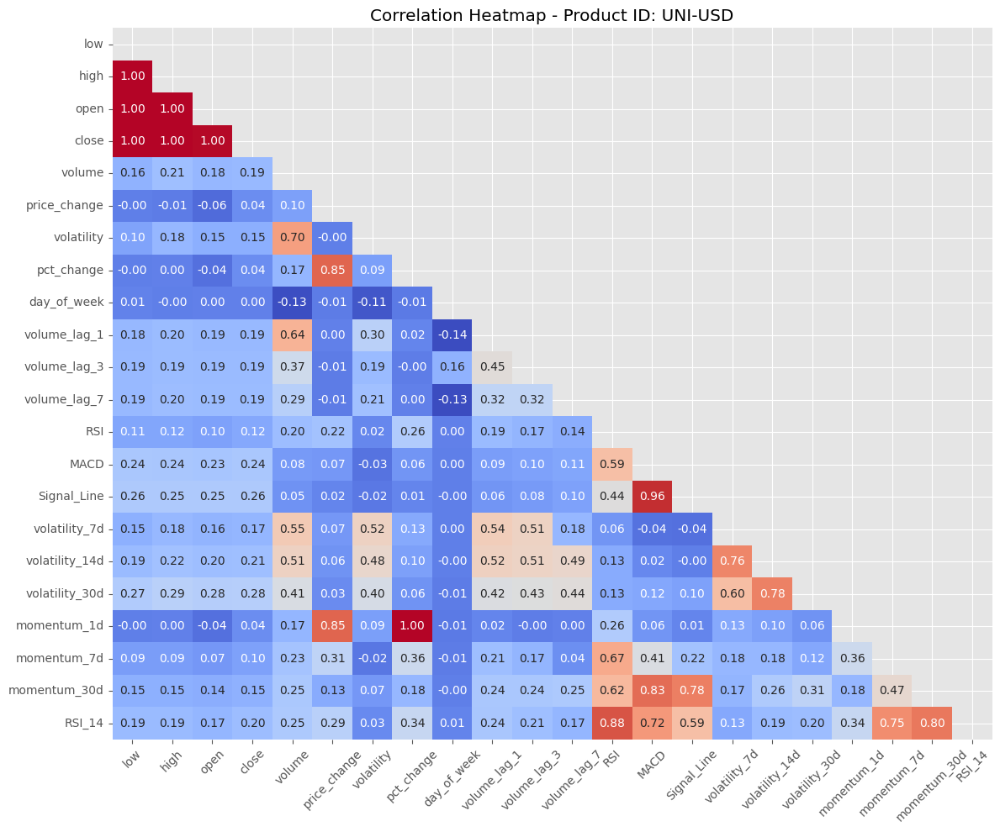

In [57]:
# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group (up to 10 groups)
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break
    
    # Select numeric columns based on dtype
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
    # Compute correlations for the group
    corr = group[numeric_columns].corr()
    
    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))
    
    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    
    # Show plot
    plt.tight_layout()
    plt.show()

In [58]:
# Drop additional columns due to high multicollinearity with 'close'
additional_columns_to_drop = ['open', 'high', 'price_change']
df.drop(columns=additional_columns_to_drop, inplace=True)


Features to drop due to high correlation in ADA-USD (>0.8): ['volatility_14d', 'Signal_Line', 'RSI_14', 'momentum_1d']


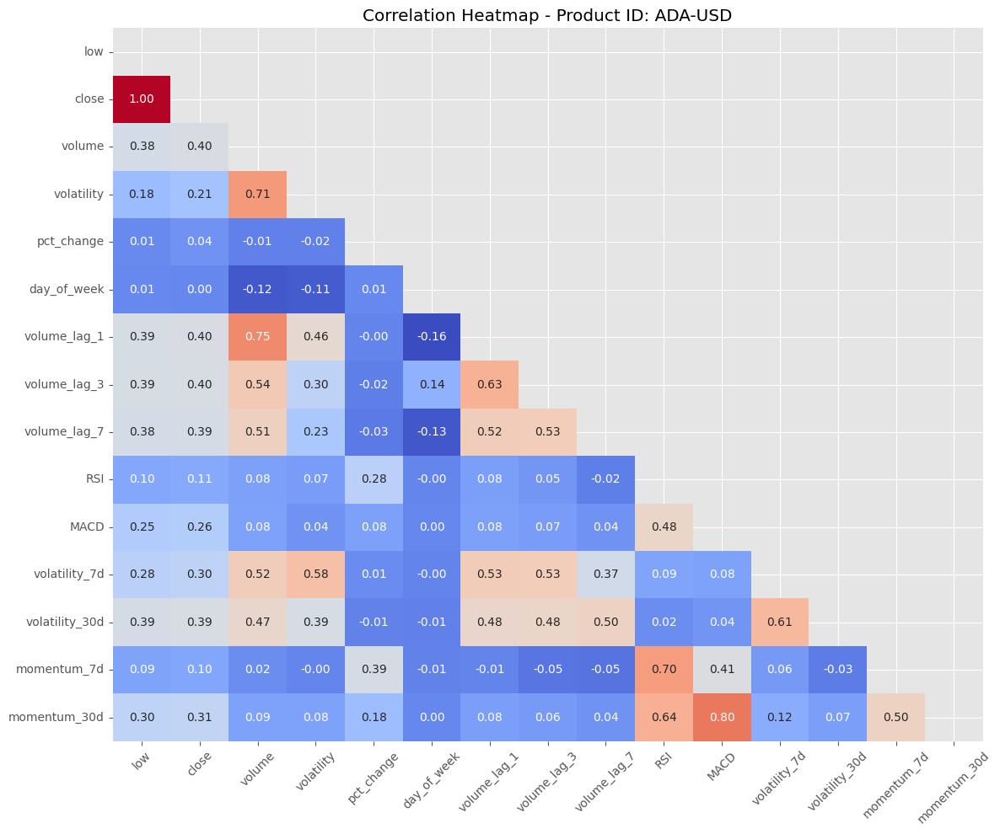

Features to drop due to high correlation in AVAX-USD (>0.8): ['momentum_1d', 'volatility_14d', 'Signal_Line', 'volatility_30d', 'RSI_14']


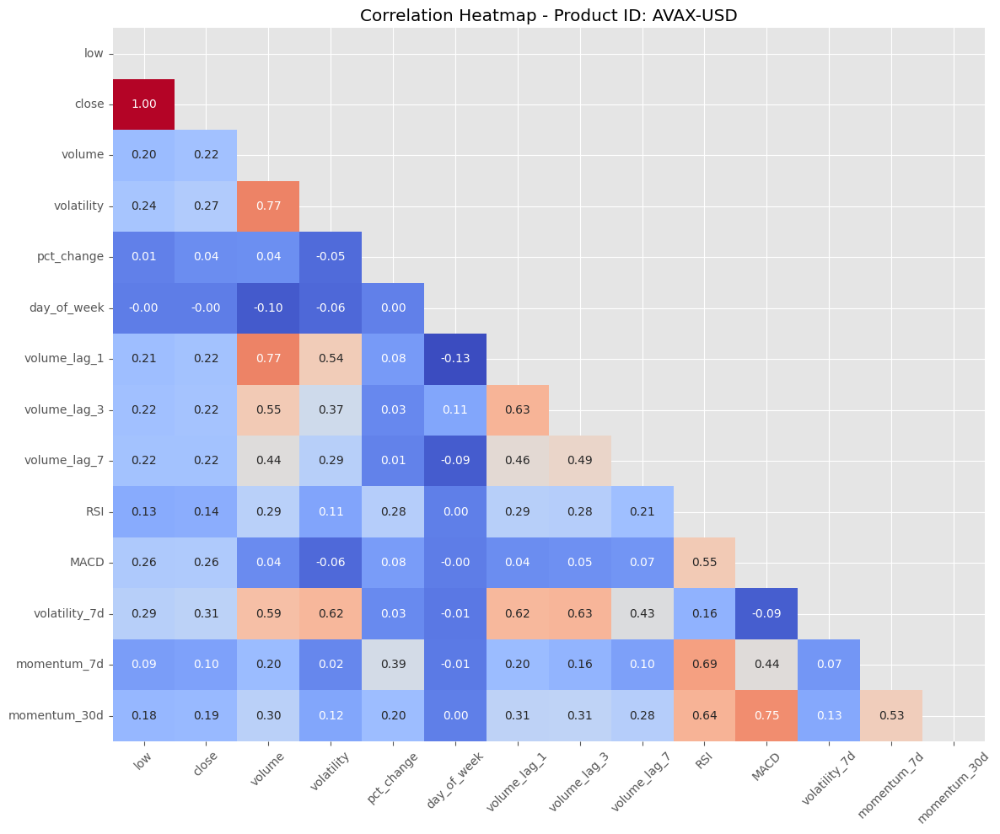

Features to drop due to high correlation in BTC-USD (>0.8): ['RSI_14', 'Signal_Line', 'momentum_30d', 'momentum_1d']


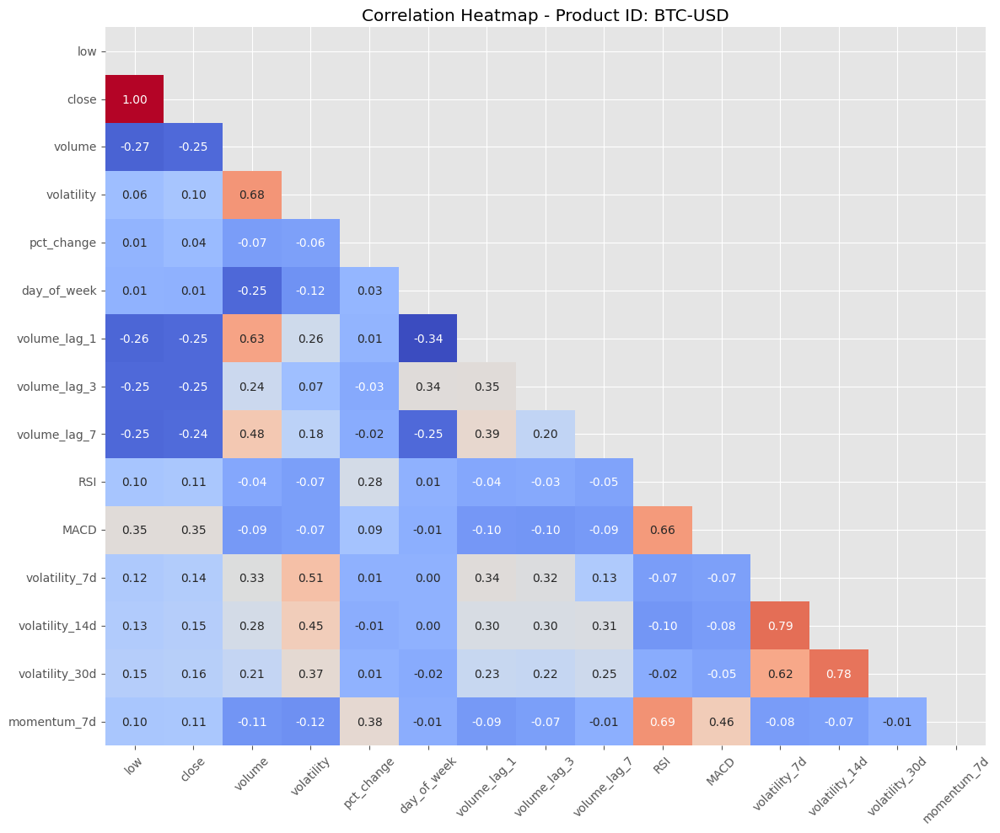

Features to drop due to high correlation in COMP-USD (>0.8): ['volatility_14d', 'Signal_Line', 'RSI_14', 'momentum_1d']


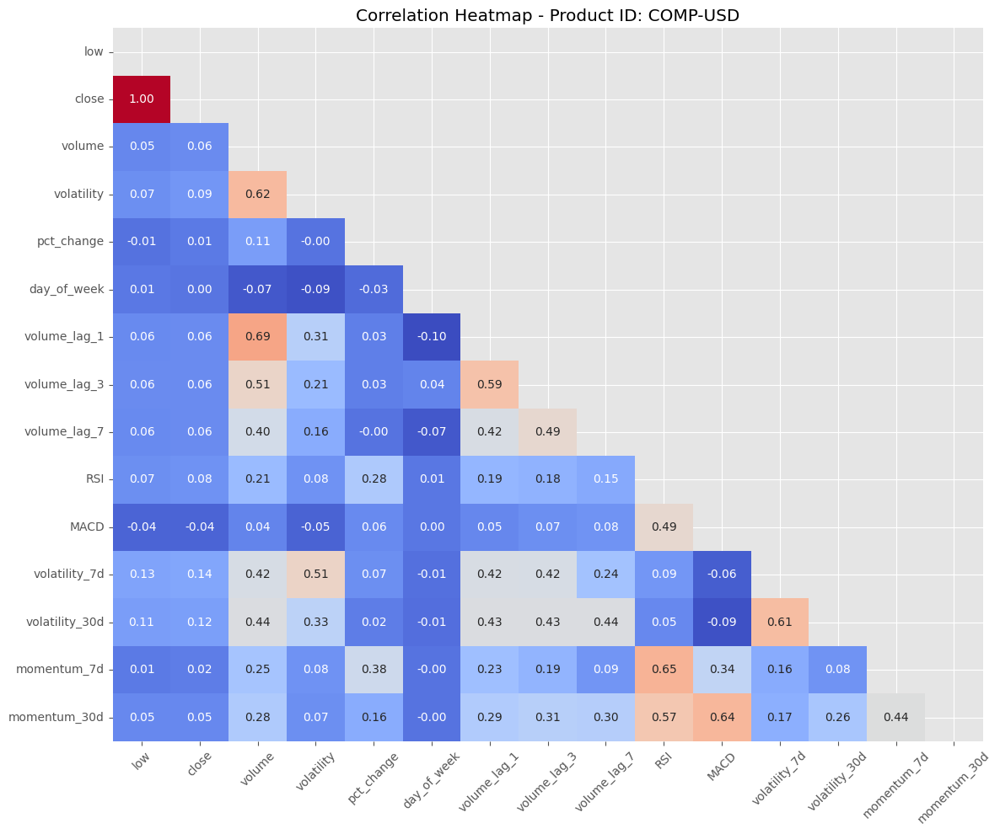

Features to drop due to high correlation in ETH-USD (>0.8): ['momentum_1d', 'momentum_30d', 'Signal_Line', 'volatility_30d', 'RSI_14']


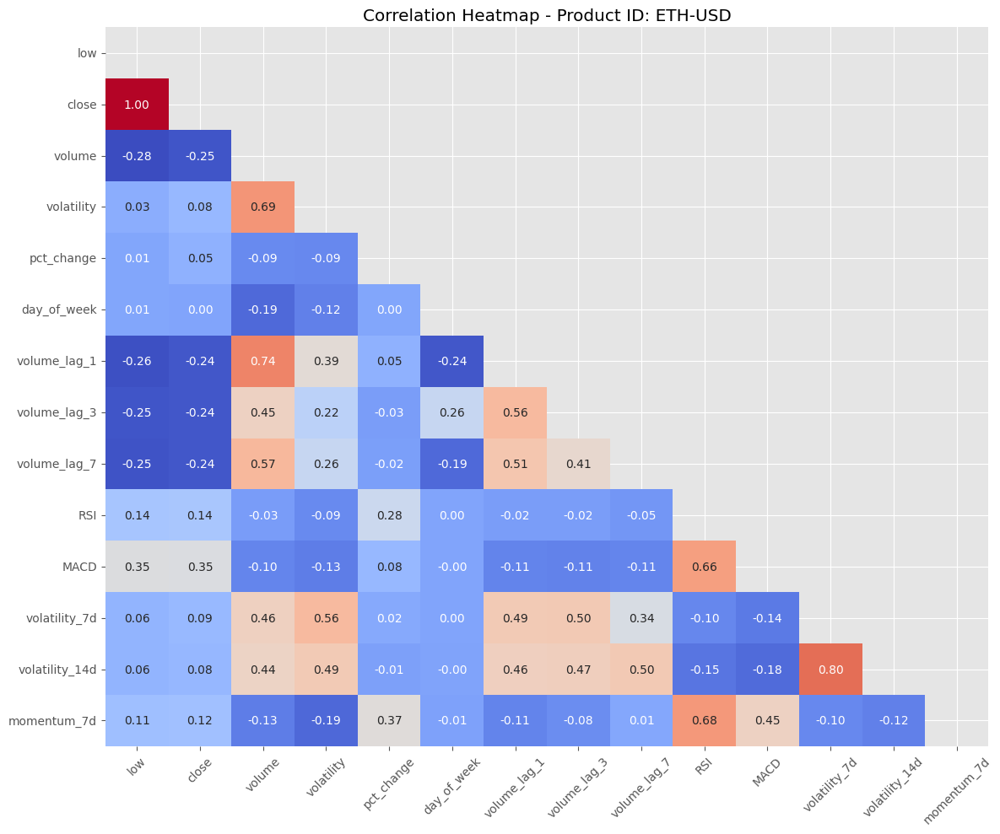

Features to drop due to high correlation in LINK-USD (>0.8): ['momentum_1d', 'volatility_14d', 'momentum_30d', 'Signal_Line', 'RSI_14']


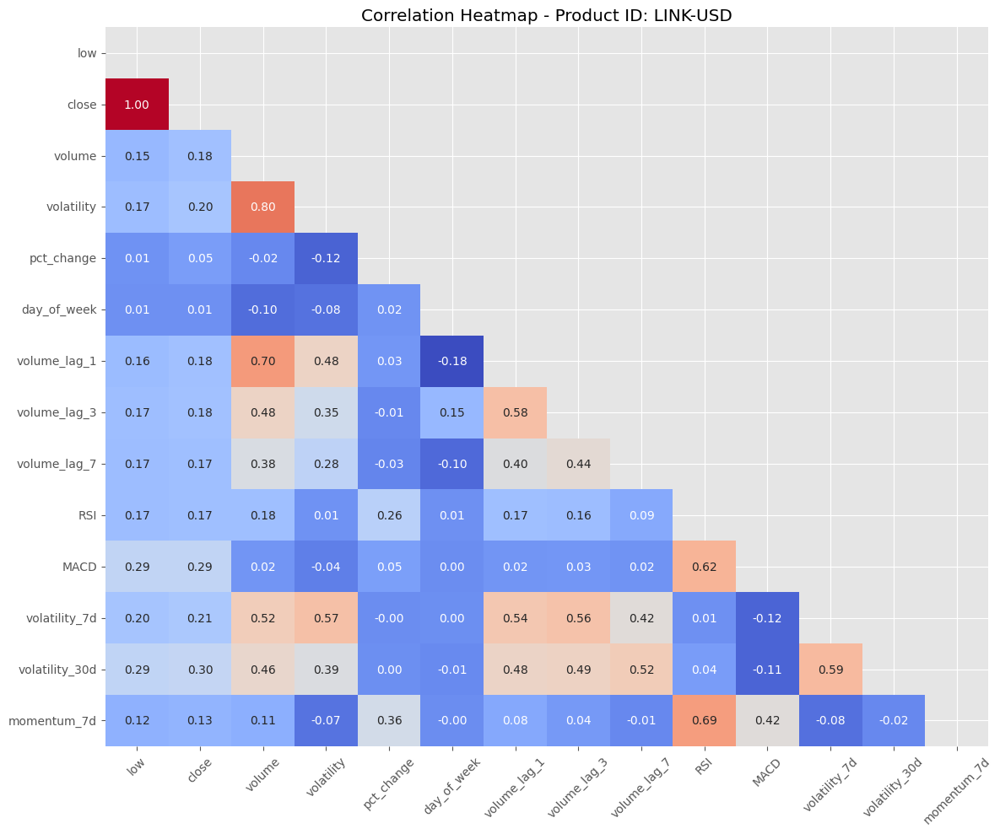

Features to drop due to high correlation in LTC-USD (>0.8): ['momentum_1d', 'volatility_14d', 'volatility', 'momentum_30d', 'Signal_Line', 'RSI_14']


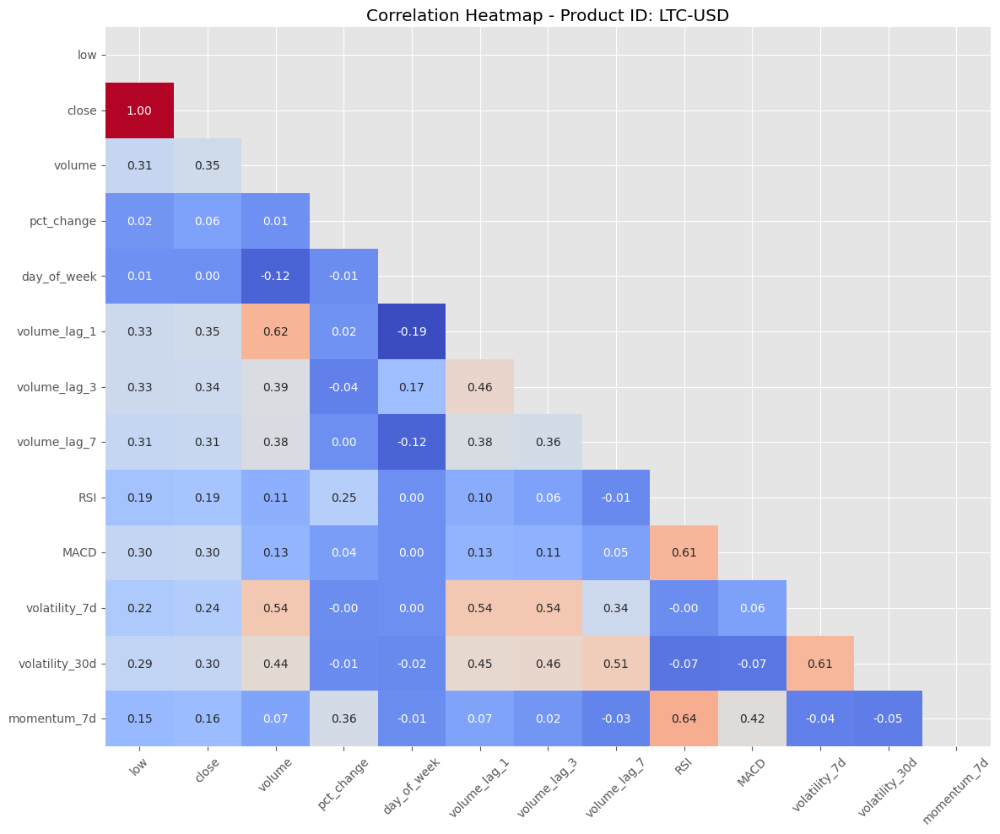

Features to drop due to high correlation in MATIC-USD (>0.8): ['momentum_1d', 'volatility_14d', 'momentum_30d', 'Signal_Line', 'RSI_14']


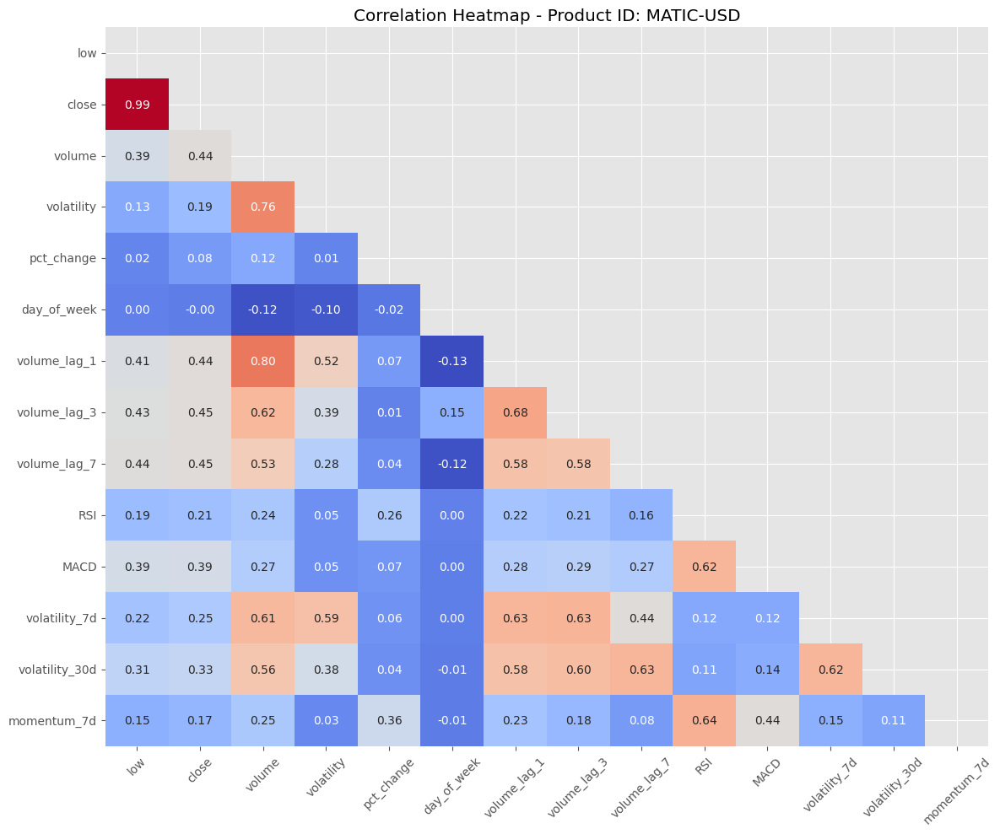

Features to drop due to high correlation in SOL-USD (>0.8): ['Signal_Line', 'RSI_14', 'momentum_1d']


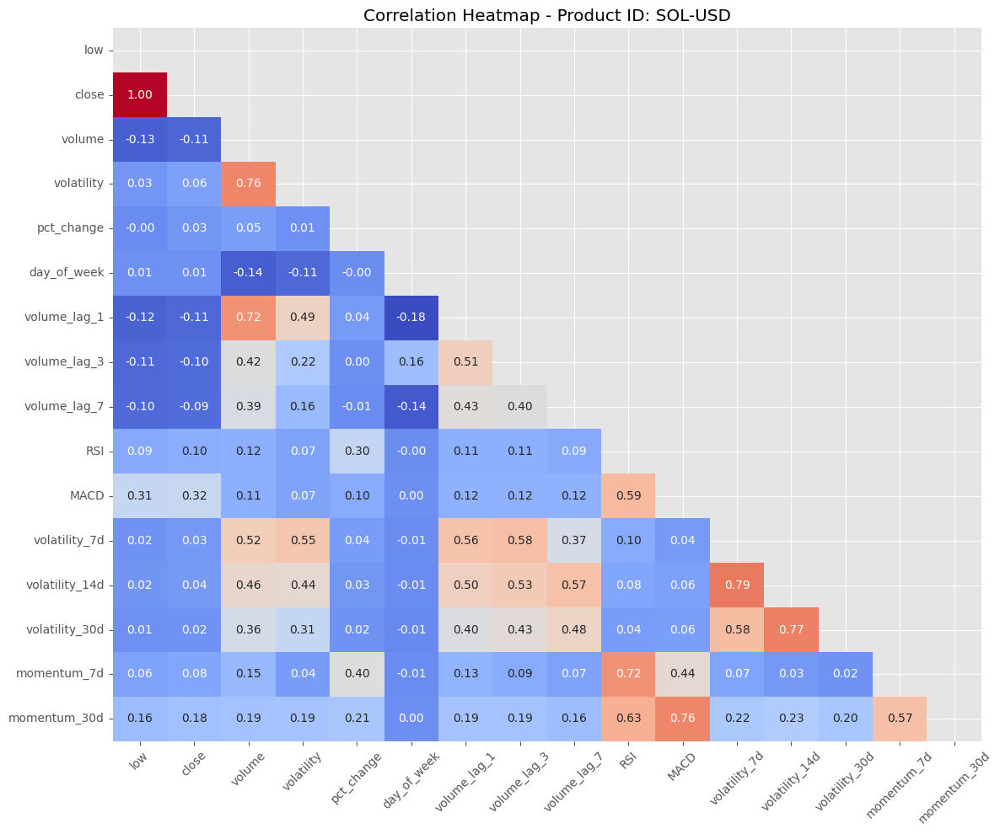

Features to drop due to high correlation in UNI-USD (>0.8): ['RSI_14', 'Signal_Line', 'momentum_30d', 'momentum_1d']


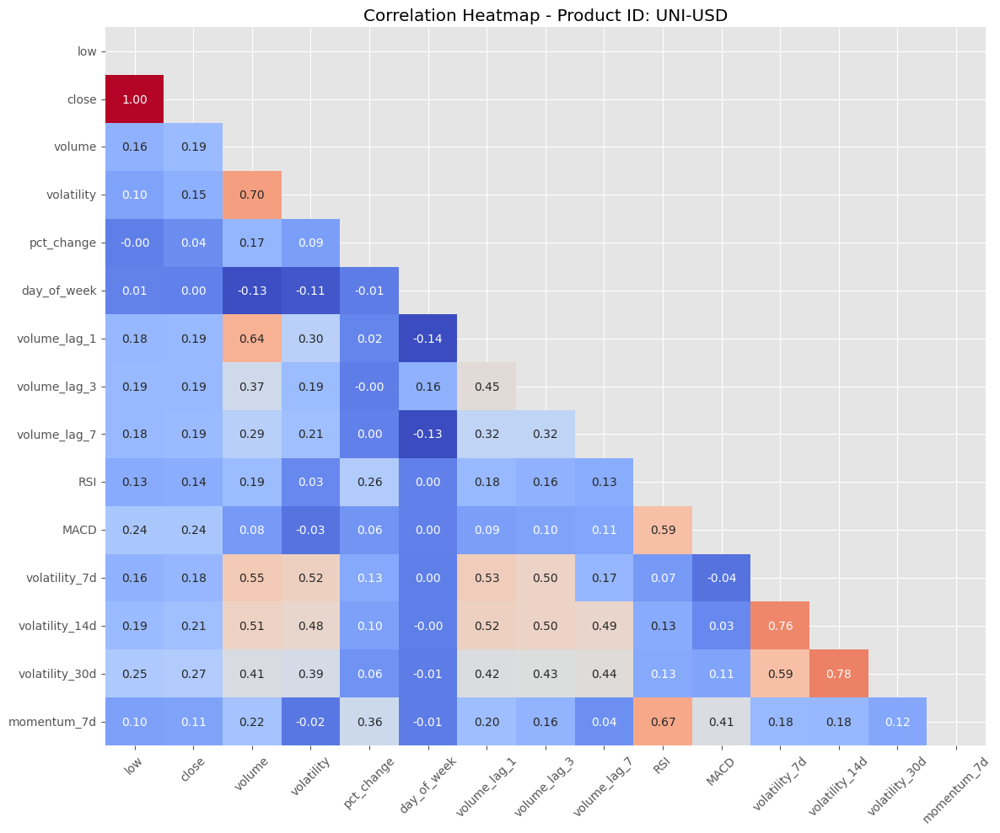

In [65]:
# Function to filter out highly correlated features, ensuring 'close' is retained
def filter_high_correlation(corr_matrix, threshold=0.80):
    to_drop = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.columns[i] == 'close':
                continue
            if abs(corr_matrix.iloc[i, j]) > threshold:
                to_drop.add(corr_matrix.columns[i])
    return list(to_drop)

# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group and plot correlation matrix
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break

    # Initial computation of correlations
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Filter out highly correlated features and drop them
    high_corr_features = filter_high_correlation(corr, threshold=0.80)
    print(f"Features to drop due to high correlation in {product_id} (>{0.80}): {high_corr_features}")

    # Drop the highly correlated features
    group = group.drop(columns=high_corr_features)

    # Recompute correlations after dropping
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))

    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)

    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)

    # Show plot
    plt.tight_layout()
    plt.show()

Features to drop due to high correlation in ADA-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'Signal_Line', 'RSI_14']


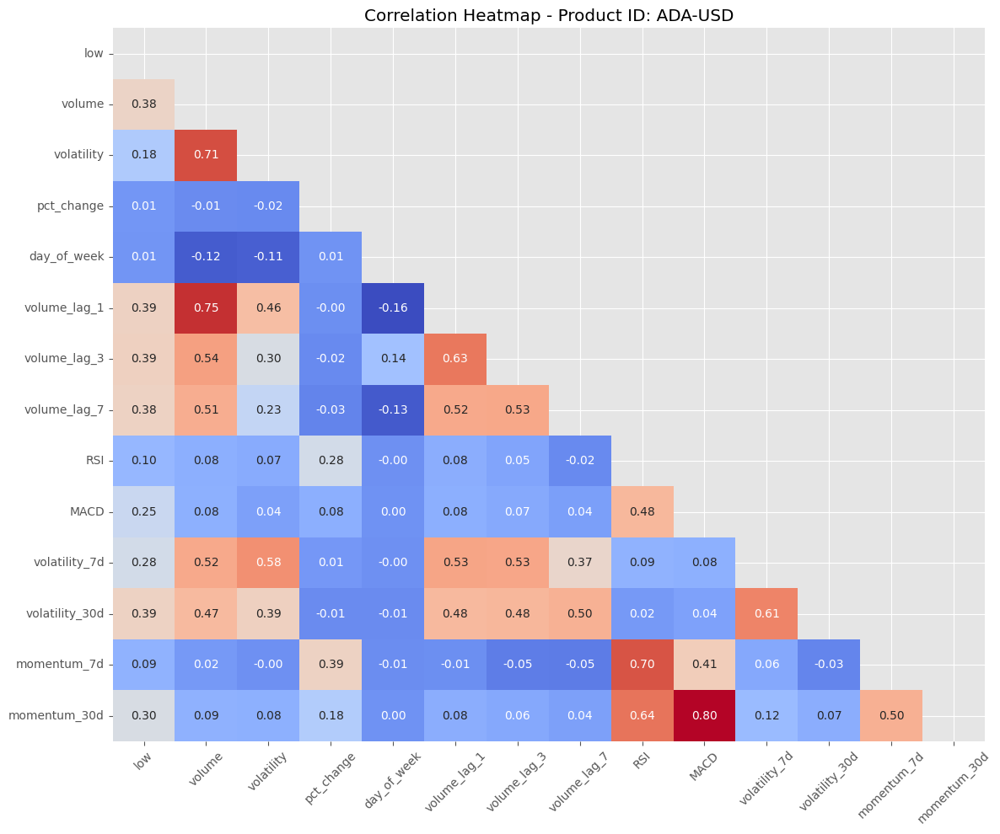

Features to drop due to high correlation in AVAX-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'Signal_Line', 'volatility_30d', 'RSI_14']


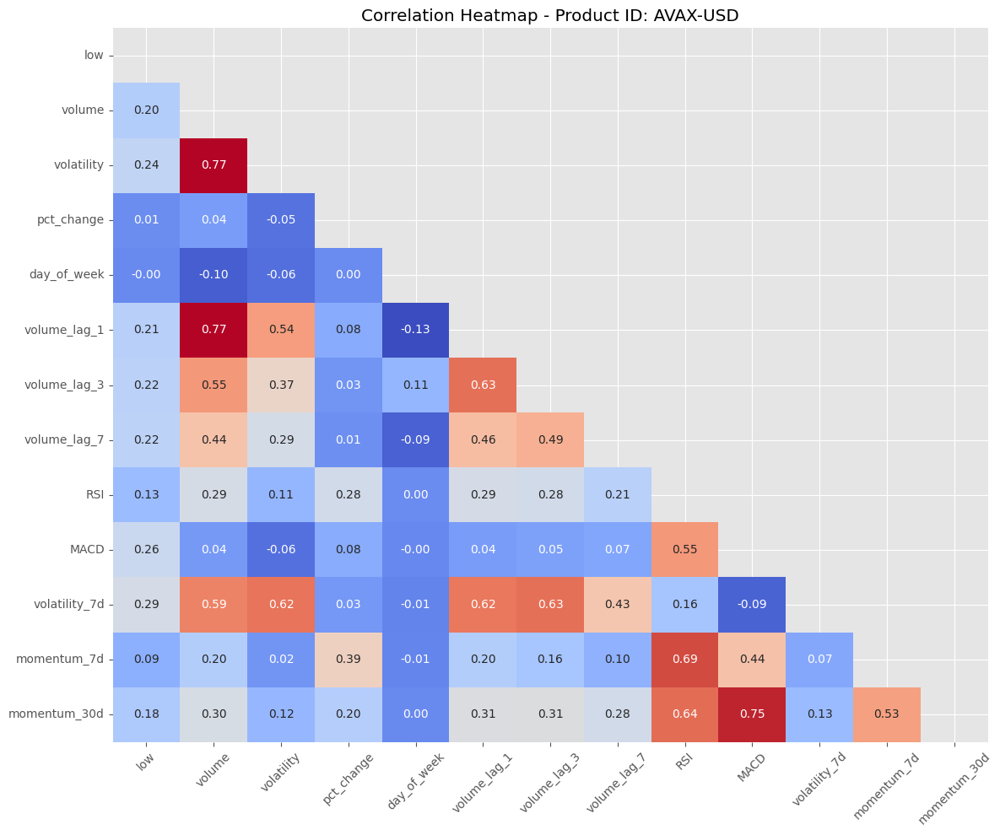

Features to drop due to high correlation in BTC-USD (>0.8): ['close', 'momentum_1d', 'momentum_30d', 'Signal_Line', 'RSI_14']


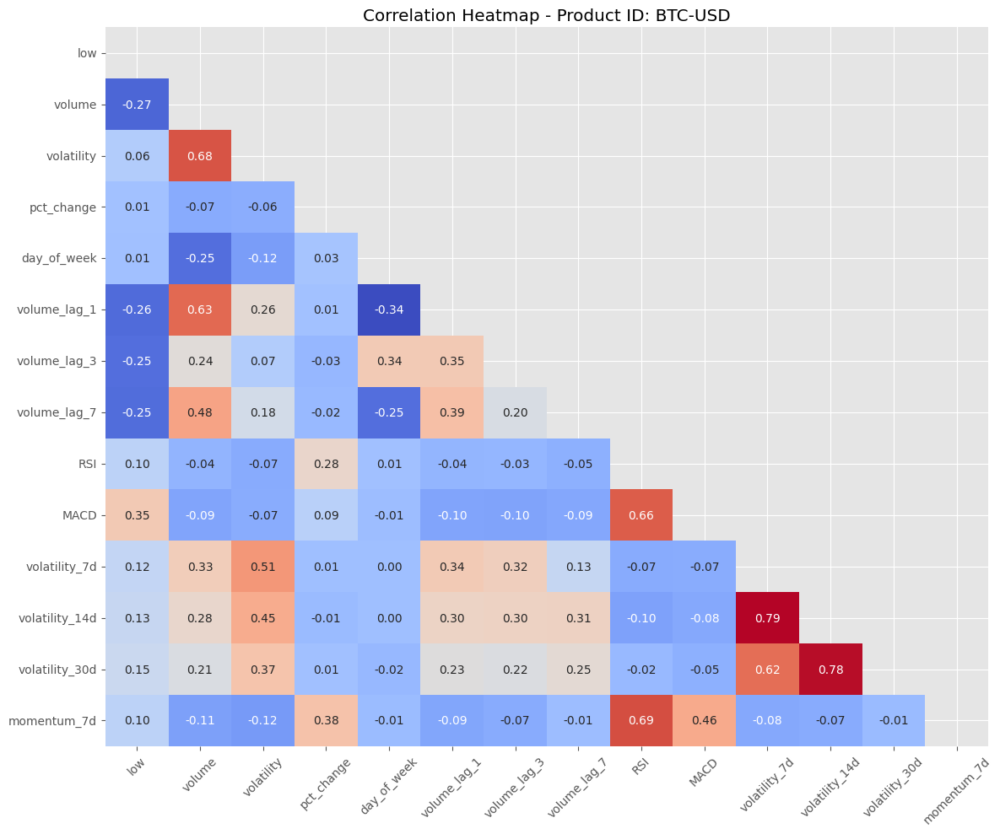

Features to drop due to high correlation in COMP-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'Signal_Line', 'RSI_14']


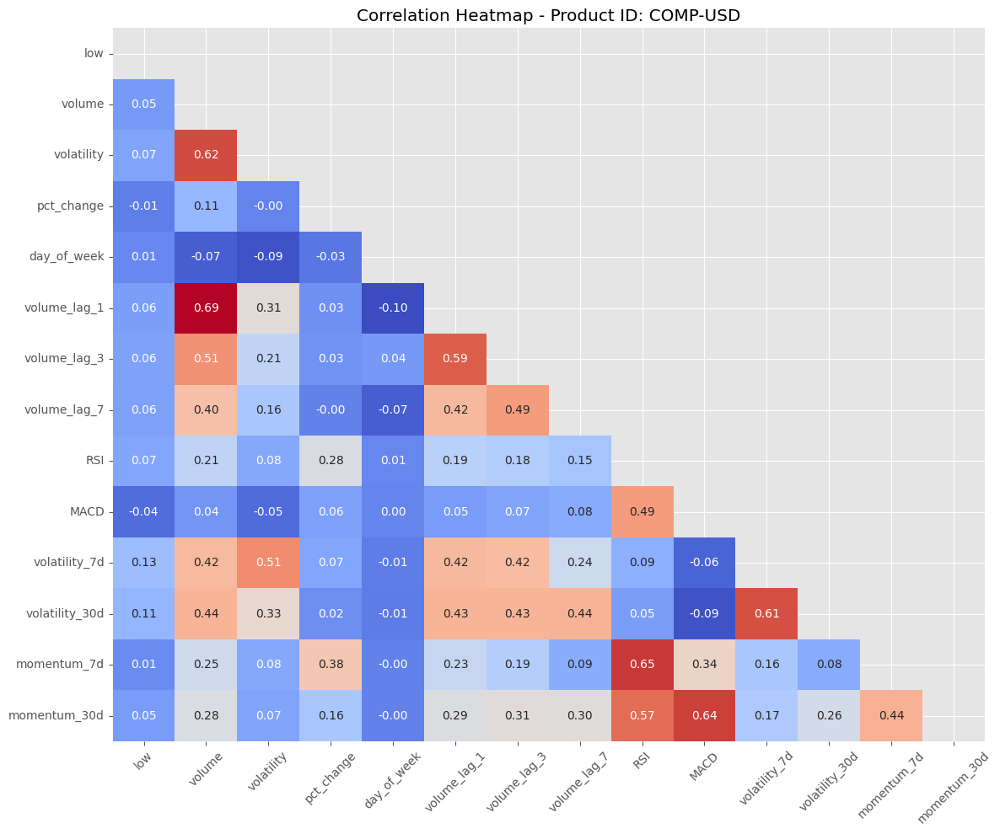

Features to drop due to high correlation in ETH-USD (>0.8): ['close', 'momentum_1d', 'momentum_30d', 'Signal_Line', 'volatility_30d', 'RSI_14']


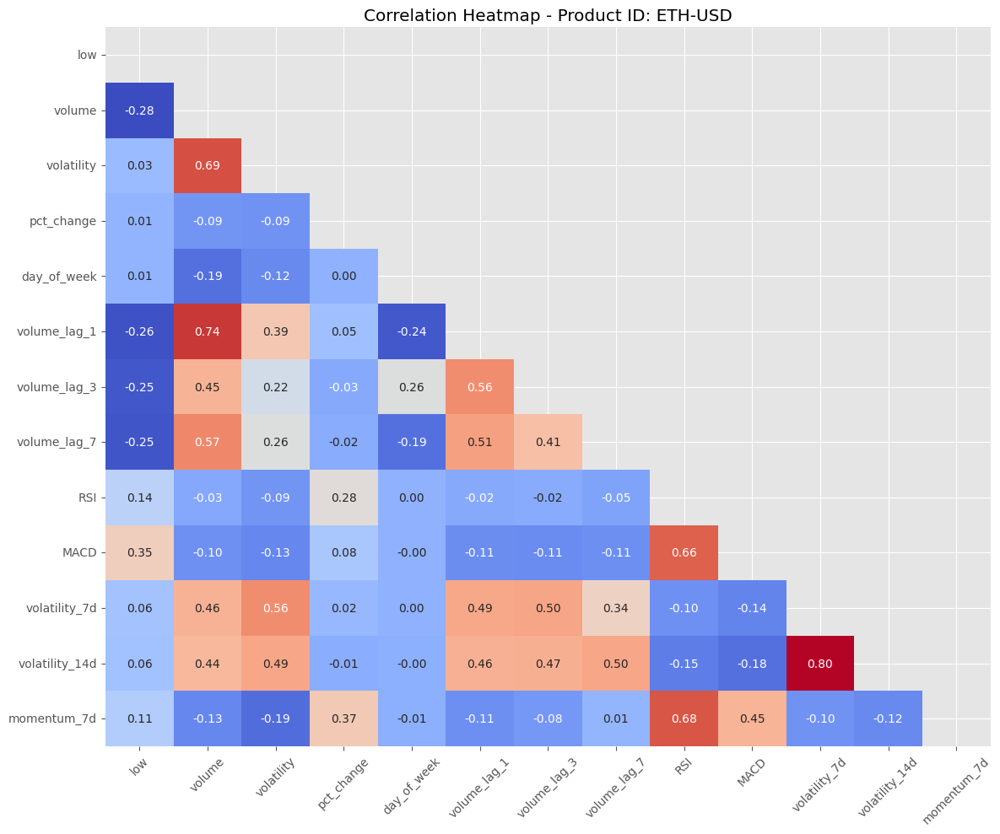

Features to drop due to high correlation in LINK-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'momentum_30d', 'Signal_Line', 'RSI_14']


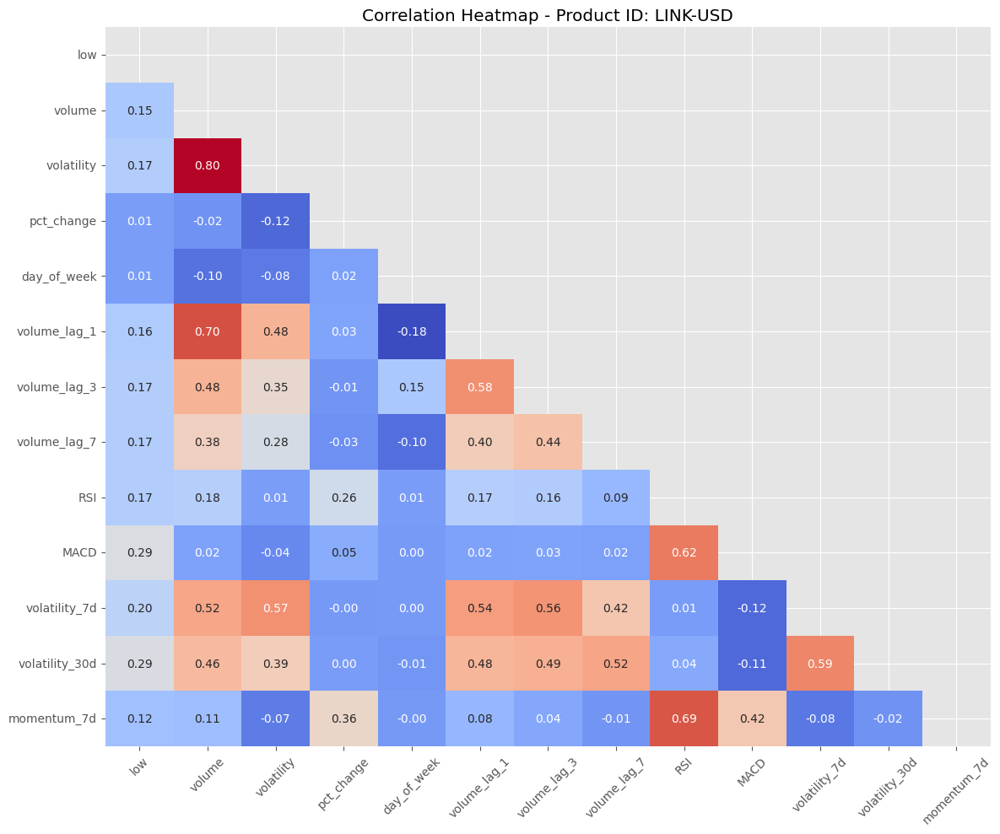

Features to drop due to high correlation in LTC-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'volatility', 'momentum_30d', 'Signal_Line', 'RSI_14']


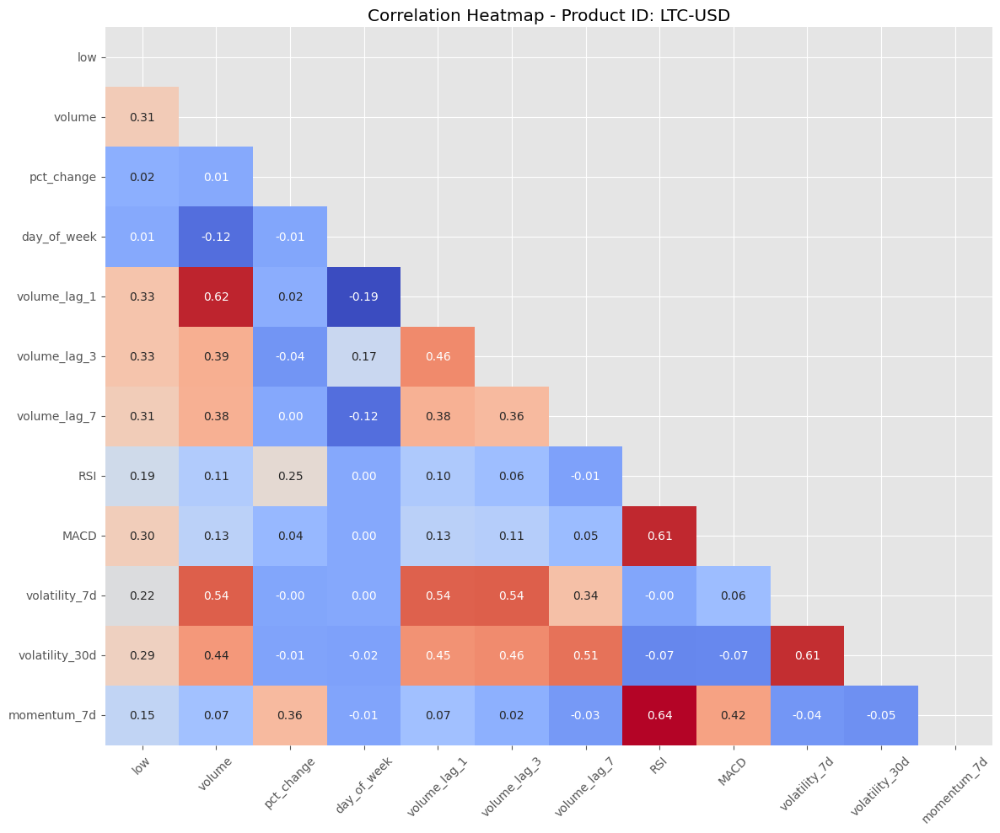

Features to drop due to high correlation in MATIC-USD (>0.8): ['close', 'momentum_1d', 'volatility_14d', 'momentum_30d', 'Signal_Line', 'RSI_14']


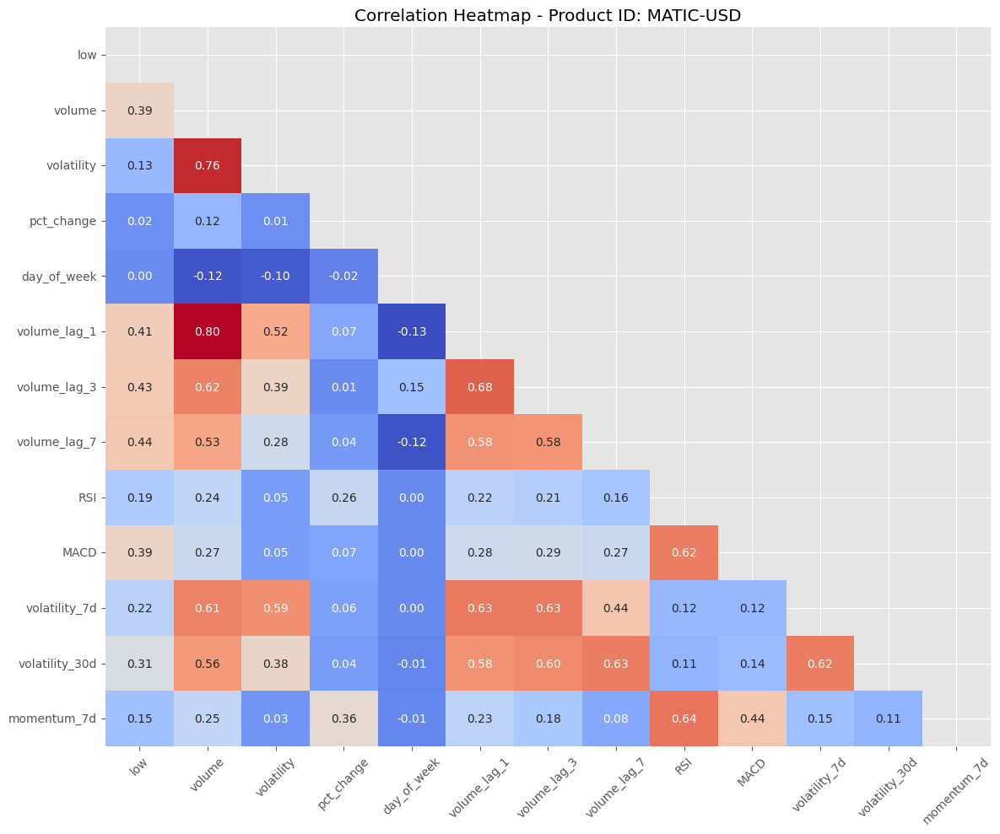

Features to drop due to high correlation in SOL-USD (>0.8): ['Signal_Line', 'close', 'RSI_14', 'momentum_1d']


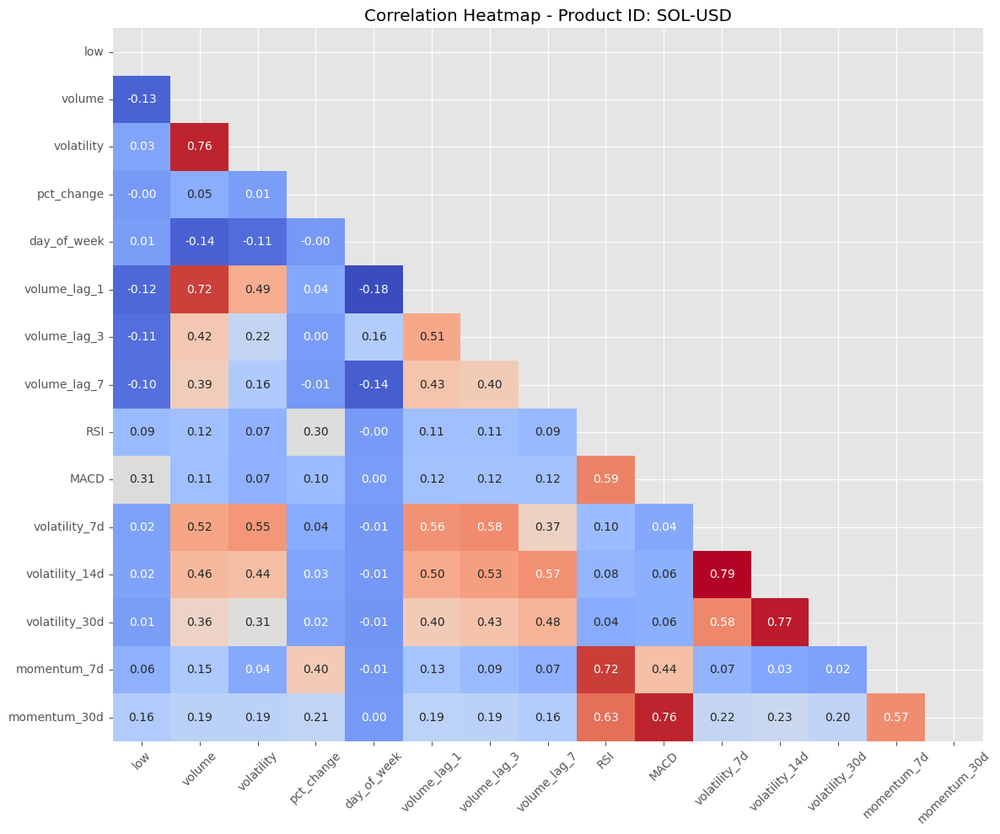

Features to drop due to high correlation in UNI-USD (>0.8): ['close', 'momentum_1d', 'momentum_30d', 'Signal_Line', 'RSI_14']


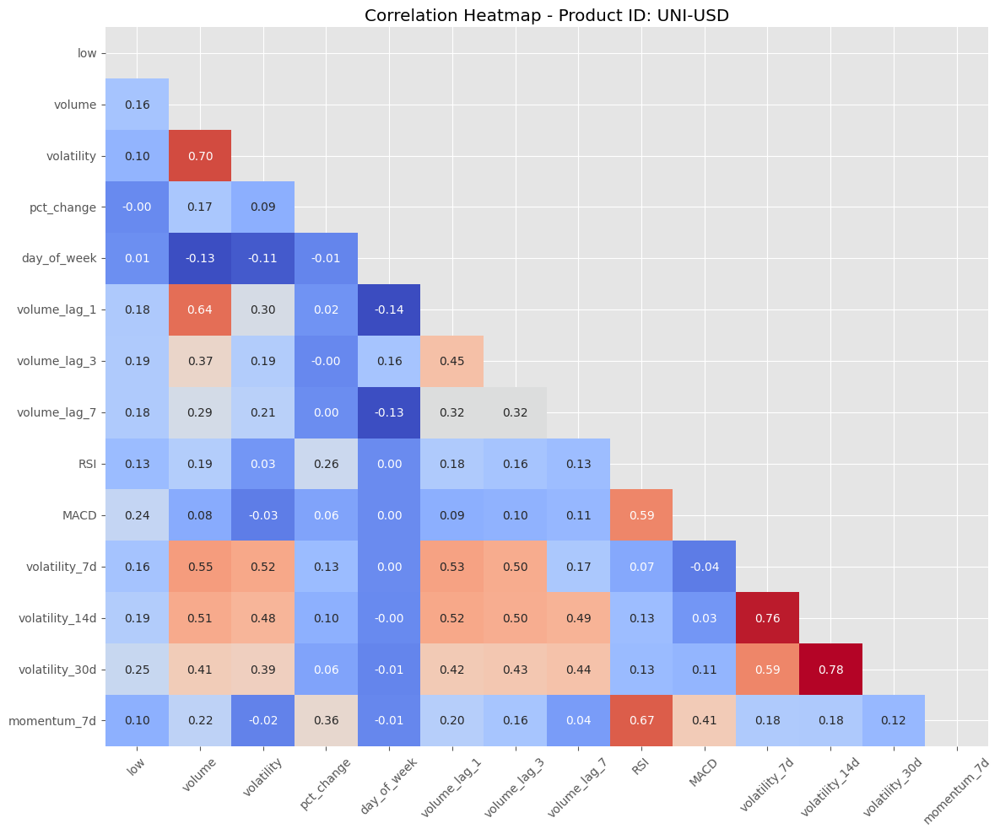

In [63]:
# Function to filter out highly correlated features
def filter_high_correlation(corr_matrix, threshold=0.80):
    to_drop = set()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                to_drop.add(corr_matrix.columns[i])
    return list(to_drop)

# Group by 'product_id'
grouped = df.groupby('product_id')

# Iterate over each group and plot correlation matrix
for i, (product_id, group) in enumerate(grouped):
    if i >= 10:
        break

    # Initial computation of correlations
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Filter out highly correlated features and drop them
    high_corr_features = filter_high_correlation(corr, threshold=0.80)
    print(f"Features to drop due to high correlation in {product_id} (>{0.80}): {high_corr_features}")

    # Drop the highly correlated features
    group = group.drop(columns=high_corr_features)

    # Recompute correlations after dropping
    numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    corr = group[numeric_columns].corr()

    # Create a mask to display only the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Initialize a figure with larger size
    plt.figure(figsize=(12, 10))

    # Plot the heatmap
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)

    # Customize plot
    plt.title(f'Correlation Heatmap - Product ID: {product_id}')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)

    # Show plot
    plt.tight_layout()
    plt.show()


In [64]:
# # Function to filter out highly correlated features
# def filter_high_correlation(corr_matrix, threshold=0.80):
#     to_drop = set()
#     for i in range(len(corr_matrix.columns)):
#         for j in range(i):
#             if abs(corr_matrix.iloc[i, j]) > threshold:
#                 to_drop.add(corr_matrix.columns[i])
#     return list(to_drop)

# # Group by 'product_id'
# grouped = df.groupby('product_id')

# # Iterate over each group (up to 10 groups) and plot correlation matrix
# for i, (product_id, group) in enumerate(grouped):
#     if i >= 10:
#         break
    
#     # Select numeric columns based on dtype
#     numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
#     # Compute correlations for the group
#     corr = group[numeric_columns].corr()
    
#     # Filter out highly correlated features
#     high_corr_features = filter_high_correlation(corr, threshold=0.80)
#     print(f"Features to drop due to high correlation in {product_id} (>{0.80}): {high_corr_features}")
    
#     # Drop the highly correlated features
#     group.drop(columns=high_corr_features, inplace=True)
    
#     # Create a mask to display only the upper triangle
#     mask = np.triu(np.ones_like(corr, dtype=bool))
    
#     # Initialize a figure with larger size
#     plt.figure(figsize=(12, 10))
    
#     # Plot the heatmap
#     sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
#     # Customize plot
#     plt.title(f'Correlation Heatmap - Product ID: {product_id}')
#     plt.xticks(rotation=45)
#     plt.yticks(rotation=0)
#     #
#     # Show plot
#     plt.tight_layout()
#     plt.show()

In [18]:
# # Additional columns to drop due to high multicollinearity with 'close'
# additional_columns_to_drop = ['open', 'high','price_change']

# # Drop the additional columns
# df.drop(columns=additional_columns_to_drop, inplace=True)

# # Group by 'product_id'
# grouped = df.groupby('product_id')

# # Iterate over each group (up to 10 groups)
# for i, (product_id, group) in enumerate(grouped):
#     if i >= 10:
#         break
    
#     # Select numeric columns based on dtype
#     numeric_columns = group.select_dtypes(include=['float64', 'int64']).columns
    
#     # Compute correlations for the group
#     corr = group[numeric_columns].corr()
    
#     # Create a mask to display only the upper triangle
#     mask = np.triu(np.ones_like(corr, dtype=bool))
    
#     # Initialize a figure with larger size
#     plt.figure(figsize=(12, 10))
    
#     # Plot the heatmap
#     sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', mask=mask, cbar=False)
    
#     # Customize plot
#     plt.title(f'Correlation Heatmap - Product ID: {product_id}')
#     plt.xticks(rotation=45)
#     plt.yticks(rotation=0)
    
#     # Show plot
#     plt.tight_layout()
#     plt.show()


In [60]:
df.dtypes

time              datetime64[ns]
product_id                object
low                      float64
close                    float64
volume                   float64
volatility               float64
pct_change               float64
day_of_week                int64
day_name                  object
volume_lag_1             float64
volume_lag_3             float64
volume_lag_7             float64
RSI                      float64
MACD                     float64
Signal_Line              float64
volatility_7d            float64
volatility_14d           float64
volatility_30d           float64
momentum_1d              float64
momentum_7d              float64
momentum_30d             float64
RSI_14                   float64
dtype: object

In [61]:
df.isnull().sum()

time                0
product_id          0
low                 0
close               0
volume              0
volatility          0
pct_change         10
day_of_week         0
day_name            0
volume_lag_1       10
volume_lag_3       30
volume_lag_7       70
RSI               130
MACD                0
Signal_Line         0
volatility_7d      70
volatility_14d    140
volatility_30d    300
momentum_1d        10
momentum_7d        70
momentum_30d      300
RSI_14            130
dtype: int64

In [62]:
# Handle missing values in numerical columns
def impute_numerical(group):
    # Forward fill
    group = group.ffill()
    # Backward fill
    group = group.bfill()
    # Linear interpolation
    group = group.interpolate(method='linear')
    return group

# Handle missing values in categorical columns
def impute_categorical(group):
    # Forward fill for categorical columns
    return group.ffill()

# Group by 'product_id' and apply imputation functions
for product_id, group in df.groupby('product_id'):
    # Impute numerical columns
    df.loc[group.index, group.select_dtypes(include=['float64', 'int64']).columns] = impute_numerical(
        group.select_dtypes(include=['float64', 'int64'])
    )
    # Impute categorical columns
    df.loc[group.index, group.select_dtypes(include=['object']).columns] = impute_categorical(
        group.select_dtypes(include=['object'])
    )

# Validate after imputation
print("Null values after imputation:")
print(df.isnull().sum())


Null values after imputation:
time              0
product_id        0
low               0
close             0
volume            0
volatility        0
pct_change        0
day_of_week       0
day_name          0
volume_lag_1      0
volume_lag_3      0
volume_lag_7      0
RSI               0
MACD              0
Signal_Line       0
volatility_7d     0
volatility_14d    0
volatility_30d    0
momentum_1d       0
momentum_7d       0
momentum_30d      0
RSI_14            0
dtype: int64


In [ ]:
#tes_new.to_csv('Cleaned_Data/cleaned_crypto_updated_722.csv')

In [23]:
# Set 'time' column as the index 
df.set_index('time', inplace=True)

# Ensure the DataFrame is sorted by time
df.sort_index(inplace=True)

In [24]:
# Validate after imputation
print("Null values after imputation:")
print(df.isnull().sum())

Null values after imputation:
product_id        0
low               0
close             0
volume            0
volatility        0
pct_change        0
day_of_week       0
day_name          0
volume_lag_1      0
volume_lag_3      0
volume_lag_7      0
RSI               0
MACD              0
Signal_Line       0
volatility_7d     0
volatility_14d    0
volatility_30d    0
momentum_1d       0
momentum_7d       0
momentum_30d      0
dtype: int64


In [31]:
# Recalculate the correct split
total_length = len(df)
test_length = int(total_length * 0.2)
train_length = total_length - test_length

# Redefine the split date based on the recalculated lengths
split_index = df.index[train_length]
split_date = split_index.strftime('%Y-%m-%d')

# Split the dataset into training and testing sets
train = df[df.index < split_date]
test = df[df.index >= split_date]

# Adjust to ensure the split is clean without overlap
train_end_date = train.index.max()
test_start_date = test.index.min()

if train_end_date >= test_start_date:
    test = df[df.index > split_date]
    train = df[df.index <= split_date]

# Confirm there are no null values in the final sets
print("Null values in training set after additional imputation:", train.isnull().sum().sum())
print("Null values in testing set:", test.isnull().sum().sum())

# Verify the lengths
print(f"Train set length: {len(train)}")
print(f"Test set length: {len(test)}")
print(f"Combined length: {len(train) + len(test)}")

# Ensure the split proportions
print(f"Train set proportion: {len(train) / len(df):.2f}")
print(f"Test set proportion: {len(test) / len(df):.2f}")

# Print detailed information about the DataFrames
print("Training and Test set sizes:", train.shape, test.shape)
print("\nTraining data range: {} to {}".format(train.index.min(), train.index.max()))
print("Testing data range: {} to {}".format(test.index.min(), test.index.max()))

# Print full information on a few rows to understand the dataset structure better
print("\nDetailed sample of Training Set:")
print(train.head())

print("\nDetailed sample of Testing Set:")
print(test.head())

# Final verification of no overlap
overlap = train.index.intersection(test.index)
assert len(overlap) == 0, "Overlap detected between training and testing sets!"

Null values in training set after additional imputation: 0
Null values in testing set: 0
Train set length: 8604
Test set length: 2160
Combined length: 10764
Train set proportion: 0.80
Test set proportion: 0.20
Training and Test set sizes: (8604, 20) (2160, 20)

Training data range: 2021-07-16 00:00:00 to 2023-12-04 00:00:00
Testing data range: 2023-12-05 00:00:00 to 2024-07-08 00:00:00

Detailed sample of Training Set:
           product_id         low       close        volume  volatility  \
time                                                                      
2021-07-16    ADA-USD     1.16610     1.17140  3.676491e+07    6.783295   
2021-07-16   COMP-USD   367.10000   367.89000  2.381554e+04   11.822392   
2021-07-16    ETH-USD  1850.15000  1877.22000  1.842217e+05    6.226522   
2021-07-16   LINK-USD    15.13583    15.23963  2.246281e+06    7.919420   
2021-07-16    LTC-USD   120.44000   120.68000  1.305546e+05    6.127532   

            pct_change  day_of_week  day_name  volu

### Scaling the Data

In [32]:
# Choose the scaler
scaler = StandardScaler()  # You can also use MinMaxScaler() or RobustScaler()

# Fit the scaler on the training data
numerical_columns = train.select_dtypes(include=['float64', 'int64']).columns
scaler.fit(train[numerical_columns])

# Transform the training and testing data
train[numerical_columns] = scaler.transform(train[numerical_columns])
test[numerical_columns] = scaler.transform(test[numerical_columns])

# Validate the scaling process
print("\nTraining and Test set sizes after scaling:", train.shape, test.shape)
print("\nTraining data range after scaling: {} to {}".format(train.index.min(), train.index.max()))
print("Testing data range after scaling: {} to {}".format(test.index.min(), test.index.max()))

# Print full information on a few rows to understand the dataset structure better
print("\nDetailed sample of Training Set after scaling:")
print(train.head())
print(train.tail())

print("\nDetailed sample of Testing Set after scaling:")
print(test.head())
print(test.tail())


Training and Test set sizes after scaling: (8604, 20) (2160, 20)

Training data range after scaling: 2021-07-16 00:00:00 to 2023-12-04 00:00:00
Testing data range after scaling: 2023-12-05 00:00:00 to 2024-07-08 00:00:00

Detailed sample of Training Set after scaling:
           product_id       low     close    volume  volatility  pct_change  \
time                                                                          
2021-07-16    ADA-USD -0.338398 -0.338220  0.809670   -0.118193    0.014166   
2021-07-16   COMP-USD -0.302311 -0.302940 -0.383571    0.801388    0.606694   
2021-07-16    ETH-USD -0.156057 -0.157738 -0.378362   -0.219798    0.233978   
2021-07-16   LINK-USD -0.337020 -0.336866 -0.311392    0.089137    0.148822   
2021-07-16    LTC-USD -0.326636 -0.326723 -0.380105   -0.237863   -0.127091   

            day_of_week  day_name  volume_lag_1  volume_lag_3  volume_lag_7  \
time                                                                          
2021-07-16     0.0

In [33]:
# Adjust display settings for better visibility
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# Check the distribution of product IDs in train and test sets
train_product_ids = train['product_id'].value_counts()
test_product_ids = test['product_id'].value_counts()

print("Train product ID distribution:")
print(train_product_ids)
print("\nTest product ID distribution:")
print(test_product_ids)


Train product ID distribution:
product_id
ADA-USD      868
COMP-USD     868
ETH-USD      868
LINK-USD     868
LTC-USD      868
MATIC-USD    868
SOL-USD      868
UNI-USD      868
BTC-USD      868
AVAX-USD     792
Name: count, dtype: int64

Test product ID distribution:
product_id
LINK-USD     216
LTC-USD      216
ADA-USD      216
ETH-USD      216
AVAX-USD     216
BTC-USD      216
SOL-USD      216
COMP-USD     216
MATIC-USD    216
UNI-USD      216
Name: count, dtype: int64


In [34]:
# Verify the time range of the datasets
train_start, train_end = train.index.min(), train.index.max()
test_start, test_end = test.index.min(), test.index.max()

print("\nTraining data range: {} to {}".format(train_start, train_end))
print("Testing data range: {} to {}".format(test_start, test_end))

# Verify the proportions
train_proportion = len(train) / len(df)
test_proportion = len(test) / len(df)

print("\nTrain set proportion: {:.2f}".format(train_proportion))
print("Test set proportion: {:.2f}".format(test_proportion))



Training data range: 2021-07-16 00:00:00 to 2023-12-04 00:00:00
Testing data range: 2023-12-05 00:00:00 to 2024-07-08 00:00:00

Train set proportion: 0.80
Test set proportion: 0.20


In [35]:
# Verify the lengths
print("\nTrain set length:", len(train))
print("Test set length:", len(test))
print("Combined length:", len(train) + len(test))
print("Original total length:", len(df))

# Check for data leakage (overlap) between train and test sets
overlap = train.index.intersection(test.index)
assert len(overlap) == 0, "Overlap detected between training and testing sets!"
print("\nNo overlap detected between training and testing sets.")



Train set length: 8604
Test set length: 2160
Combined length: 10764
Original total length: 10764

No overlap detected between training and testing sets.


In [36]:
# Detailed sample of Training Set
print("\nDetailed sample of Training Set:")
print(train.head(10))  # Print more rows if necessary

# Detailed sample of Testing Set
print("\nDetailed sample of Testing Set:")
print(test.head(10))  # Print more rows if necessary

# Reset display settings to default
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.expand_frame_repr')



Detailed sample of Training Set:
           product_id       low     close    volume  volatility  pct_change  day_of_week  day_name  volume_lag_1  volume_lag_3  volume_lag_7       RSI      MACD  Signal_Line  volatility_7d  volatility_14d  volatility_30d  momentum_1d  momentum_7d  momentum_30d
time                                                                                                                                                                                                                                                                
2021-07-16    ADA-USD -0.338398 -0.338220  0.809670   -0.118193    0.014166     0.001221  Thursday      0.809654      0.809162      0.808127  0.901640 -0.009171    -0.008305       0.519644       -0.261896        0.145531     0.014166     0.205949      2.383303
2021-07-16   COMP-USD -0.302311 -0.302940 -0.383571    0.801388    0.606694     0.001221  Thursday     -0.383573     -0.383800     -0.384282  0.523822 -0.009171    -0.008305       0.9

In [37]:
print("\nDetailed sample of last few rows of Training Set:")
print(train.tail())

print("\nDetailed sample of last few rows of Testing Set:")
print(test.tail())



Detailed sample of last few rows of Training Set:
           product_id       low     close    volume  volatility  pct_change  \
time                                                                          
2023-12-04    BTC-USD  3.604551  3.700982 -0.383631   -0.248428    1.020935   
2023-12-04    UNI-USD -0.337933 -0.337745 -0.355770   -0.060107    0.149717   
2023-12-04  MATIC-USD -0.338436 -0.338255  0.393310   -0.066403   -0.113070   
2023-12-04   LINK-USD -0.337018 -0.336812 -0.264800    0.132973    0.112196   
2023-12-04   COMP-USD -0.333708 -0.333419 -0.381382    0.232094   -0.058482   

            day_of_week day_name  volume_lag_1  volume_lag_3  volume_lag_7  \
time                                                                         
2023-12-04      1.50216   Sunday     -0.384114     -0.384041     -0.384617   
2023-12-04      1.50216   Sunday     -0.368965     -0.362479     -0.350071   
2023-12-04      1.50216   Sunday      0.050337      0.235205      0.105281   
2023-

In [38]:
# Ensure no overlap between training and testing sets
for product_id in df['product_id'].unique():
    max_train_date = train[train['product_id'] == product_id].index.max()
    min_test_date = test[test['product_id'] == product_id].index.min()
    print(f"Product ID: {product_id} - Max train date: {max_train_date}, Min test date: {min_test_date}")
    assert max_train_date < min_test_date, f"Overlap detected for product_id {product_id}"


Product ID: ADA-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: COMP-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: ETH-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: LINK-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: LTC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: MATIC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: SOL-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: UNI-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: BTC-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00
Product ID: AVAX-USD - Max train date: 2023-12-04 00:00:00, Min test date: 2023-12-05 00:00:00


In [39]:
# Verify that the temporal continuity is maintained within each product ID
for product_id, group in df.groupby('product_id'):
    max_train_date = train[train['product_id'] == product_id].index.max()
    min_test_date = test[test['product_id'] == product_id].index.min()
    print(f"Product ID: {product_id}")
    print(f"  Train max date: {max_train_date}")
    print(f"  Test min date: {min_test_date}")
    assert max_train_date < min_test_date, f"Data leakage detected for product_id {product_id}"


Product ID: ADA-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: AVAX-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: BTC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: COMP-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: ETH-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: LINK-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: LTC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: MATIC-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: SOL-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
Product ID: UNI-USD
  Train max date: 2023-12-04 00:00:00
  Test min date: 2023-12-05 00:00:00
